In [1]:
#import packages
import xarray as xr
import dask
import matplotlib.pyplot as plt
import numpy as np
import os


import matplotlib as mpl
import scipy
import glob as glob
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import calendar
import xskillscore as xs
from scipy.stats import iqr
import functools as ft
import cartopy.crs as ccrs
import matplotlib.patches as patches
from shapely import geometry
plt.rcParams['font.size'] = 14


Figure 1: Multimodel median of SST bias relative to NOAA OI SST v2. Stippled where at least 15/20 models agree on sign of bias. This is sginificant at 95% in a binomial test. WTIO, SETIO, and Arabian Sea are outlined in boxes.

In [2]:
#load in SST data for each model into dictionary with model name as key

In [3]:
datadir = '/home/z5113258/Documents/data/CMIP6_HB_new/'
#dict with file names
varis = {'SST':'_tos.nc'}
SST_D={}
#get all data for temp tendency
for model in os.listdir(datadir):
    #go thorugh all varis
    if model in ['NESM3']:
        pass
    else:
        #input file
        inp_files = (os.path.join(datadir, model, str(model+"_tos.nc")))
        try:
            #load in file
            var = xr.open_dataarray(inp_files)
            #now append data to model dict
            SST_D[model] = var
        except Exception as e:
            print("Error. ", e)
            pass

Error.  [Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_tos.nc'


In [4]:
#now get models timeseries
for i, model in enumerate(SST_D.keys()):
    try:    
        sst = SST_D[model]
        #now turn into an array
        if i == 0:
            SSTM = sst
        else:
            SSTM = xr.concat([SSTM, sst], dim = 'model')
    except Exception as e:
            print("something went wrong, here is the error code", e)

In [5]:
#load in SST to compare to
OSST = xr.open_mfdataset('/home/z5113258/Documents/data/NOAA_OISSTv2.nc', parallel=True).sst
LSM = xr.open_dataset('/home/z5113258/Documents/data/LSM.nc').mask
OSST= OSST.where(LSM[0])
OSST = OSST.groupby('time.month').mean('time').sel(lat=slice(-40,30),lon=slice(30,125))

In [6]:
#calculate bias and the significance levels
SSTB = SSTM - OSST
#find cells where pos and negative
SSTB_pos = xr.where(SSTB>0, 1,0)
SSTB_neg = xr.where(SSTB<0, 1,0)
#get where majority of cells agree on sign, ie, at least 15/20
SSTB_pos_ = SSTB_pos.sum('model')
pos = xr.where(SSTB_pos_ >= 15, 1, 0)

SSTB_neg_ = SSTB_neg.sum('model')
neg = xr.where(SSTB_neg_ >= 15, 1, 0)
sigbias = xr.where((pos+neg)==1, 1, np.nan)

In [7]:
#make a land sea mask
SEA = SSTB.mean('month').median('model')

In [8]:
SEA1 = SEA.fillna(-99)
SEA2 = SEA1.where(SEA1==-99, drop=True)
SEA2.to_netcdf("/home/z5113258/Documents/data/C6LSM.nc")

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


In [35]:
SSTB.where(sigbias == 1, 0).to_netcdf("/home/z5113258/Documents/data/SSTBIAS.nc")

Now plot figure, with month headings

In [7]:
import warnings
warnings.filterwarnings("ignore", message="invalid value encountered in true_divide")
warnings.filterwarnings("ignore", message="All-NaN slice encountered")
#ignore warnings that come up when plotting


/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/z5113258/anaconda3/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)
/home/z5113258/anaconda3/lib/python3.8/site-

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.

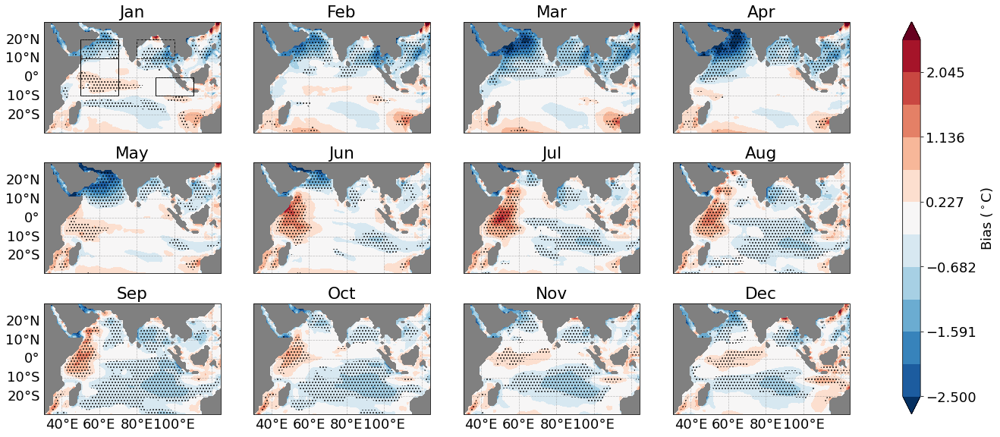

In [45]:
plt.rcParams.update({'font.size': 18})

#plot facet grid
fg = SSTB.median(dim = "model", skipna = True).plot.contourf(col='month', col_wrap = 4,  transform=ccrs.PlateCarree(),
                             subplot_kws={"projection": ccrs.PlateCarree()}, 
                              figsize=(20,8), facecolor = 'white', vmin = -2.5, vmax = 2.5, levels =12,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                cbar_kwargs=dict(label='Bias ($^\circ$C)'))
#plt.set_facecolor('white')

#Add in features
for i, ax in enumerate(fg.axes.flat):
    ax.contourf(sigbias.lon, sigbias.lat, sigbias[i], [1,2], colors='none', hatches=['...',None])
    #ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
    if i in [0,1,2,3,4,5,6,7]:
        gl.bottom_labels = False
    if i in [1,2,3,5,6,7,9,10,11]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False
    #add in the boxes of interest
    if i == 0:
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="k", fill = False, linewidth=1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="k", fill = False, linewidth=1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="k", fill = False, linewidth=1))
        ax.add_patch(patches.Rectangle((80,10), 20, 10, color="k", fill = False, linewidth=1, linestyle = '--'))

#now add the month labels
titles =['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun','Jul', 
         'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
for ax,title in zip(fg.axes.flatten(),titles):
    ax.set_title(title )
#plt.savefig('/home/z5113258/Documents/figures/Paper_23-05-26/F_1.eps', pad_inches = 1, bbox_inches = 'tight')
#plt.savefig('/home/z5113258/Documents/figures/Figures_high_res/F_1.png', dpi=600, pad_inches = 1,  bbox_inches = 'tight', facecolor = 'white')
plt.savefig('/home/z5113258/Documents/figures/Figures_high_res/F_1.pdf', dpi=600, pad_inches = 1,  bbox_inches = 'tight', facecolor = 'white')


Now we'll look at figure 2,7,11 - the regional heat budget terms

In [6]:
#load in data
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/CMIP6_HB_new/'
#dict with file names
varis = {'dTdt':'_temp_tendency.nc', 'ua':'_u_advection.nc', 'va':'_v_advection.nc',
             'wa':'_w_advection.nc', 'lw':'_netLW.nc', 'sw':'_netSW.nc', 'lhf':'_hfls.nc', 
             'shf':'_hfss.nc', 'SST': '_tos.nc'}
models={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                #put into dict
                mod[key]=var
                models[model] = mod

            except Exception as e:
                print(e)
                pass

[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_temp_tendency.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_u_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_v_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_w_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_netLW.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_netSW.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_hfls.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_hfss.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_f

In [7]:
#load in REAn products with all HB terms
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/REAN_HB/'
#dict with file names
varis = {'dTdt':'_temp_tendency.nc', 'ua':'_u_advection.nc', 'va':'_v_advection.nc',
             'wa':'_w_advection.nc', 'q':'_qnet.nc', 'SST': '_tos.nc'}
OBS={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                #put into dict
                mod[key]=var
                OBS[model] = mod

            except Exception as e:
                print(e)
                pass

[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_temp_tendency.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_u_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_v_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_w_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_tos.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_temp_tendency.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_u_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_v_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_w_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Doc

In [8]:
#load in NOAAOISSTV2 and get temp tendency
OSST = xr.open_mfdataset('/home/z5113258/Documents/data/NOAA_OISSTv2.nc', parallel=True).sst
LSM = xr.open_dataset('/home/z5113258/Documents/data/LSM.nc').mask
OSST= OSST.where(LSM[0]).sel(lat=slice(-40,30),lon=slice(30,125))
Odt = OSST.differentiate(coord = 'time', edge_order=1,  datetime_unit= 's')
OSST = OSST.groupby('time.month').mean('time')
Odt = Odt.groupby('time.month').mean('time')
OAFQ = xr.open_mfdataset('/home/z5113258/Documents/data/OAFlux/OAflux_qnet.nc', parallel=True).qnet
e5_LH = xr.open_dataarray("/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_lhf.nc")
e5_SH = xr.open_dataarray("/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_shf.nc")
e5_SW = xr.open_dataarray("/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_swrf.nc")
e5_LW = xr.open_dataarray("/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_lwrf.nc")
E5Q = (e5_LW+e5_SW+e5_SH+e5_LH)#terms have correct sign so are additive

In [9]:
#reverse signs on advection, pack Qnet nad HF terms separately
models1={}
model_HF={}
for model in models.keys():
    try:
        HB=models[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        lw=HB['lw']
        sw=HB['sw']
        lhf=HB['lhf']
        shf=HB['shf']
        Q=(lw+sw-lhf-shf)/(3986*1026*50)#terms are all positive so have to add in sign, and scale to degC/month
        SST = HB['SST']
        resid = T-Q+U+V+W
        #repack dict with correct sign so everything is additive
        HB1={'dTdt':T, 'ua':-U, 'va':-V,'wa':-W, 'q':Q, 'res':resid, 'SST':SST}
        #pack HF terms into different dict
        HF={'lw':lw, 'sw':sw, 'lhf':-lhf, 'shf':-shf, 'q':Q}
        model_HF[model]=HF
        models1[model]=HB1
    except Exception as e:
        print(e, model)
#do the same for OBS
OBS1={}
for model in OBS.keys():
    try:
        HB=OBS[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        SST = HB['SST']
        resid = T-Q+U+V+W
        #repack dict
        HB1={'dTdt':T, 'ua':-U, 'va':-V,'wa':-W, 'q':Q, 'res':resid, 'SST':SST}
        OBS1[model]=HB1
    except Exception as e:
        print(e, model)

'dTdt' OAFLUX
'dTdt' ERA5
'ua' ARGO


In [10]:
def get_region(da, lat, lat_r, lon, lon_r):
    DA_ss = da.sel(lat=slice(lat, lat_r),lon=slice(lon, lon_r)).mean(['lat', 'lon'])
    return DA_ss

In [11]:
def get_model_TS(MM_D):
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        resid = HB['res']
        SST = HB['SST']

        T=T.assign_coords({'model':model})
        U=U.assign_coords({'model':model})
        V=V.assign_coords({'model':model})
        W=W.assign_coords({'model':model})
        Q=Q.assign_coords({'model':model})
        resid = resid.assign_coords({'model':model})
        SST = SST.assign_coords({'model':model})
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            VM = V
            WM = W
            QM = Q
            RM = resid
            SM = SST
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
            VM = xr.concat([VM, V], dim = 'model')
            WM = xr.concat([WM, W], dim = 'model')
            QM = xr.concat([QM, Q], dim = 'model')
            RM = xr.concat([RM, resid], dim = 'model')
            SM = xr.concat([SM, SST], dim = 'model')
    return TM, UM, VM, WM, QM, RM, SM

In [14]:
TO, UO, VO, WO, QO, RO, SO = get_model_TS(OBS1)


In [15]:
OBS1.keys()

dict_keys(['GODAS', 'SODA3.4.2', 'ORAS5'])

In [12]:
#fucntion to create regional plots for multimodel mean of each variable with SST
def plot_region_MM_new(MM_D, OBS_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    TM, UM, VM, WM, QM, RM, SM = get_model_TS(MM_D)
    TO, UO, VO, WO, QO, RO, SO = get_model_TS(OBS_D)

    #Now calculate the multimodel means/
    TMM = TM.median(dim = 'model')
    UMM = UM.median(dim = 'model')
    VMM = VM.median(dim = 'model')
    WMM = WM.median(dim = 'model')
    QMM = QM.median(dim = 'model')
    RMM = RM.median(dim = 'model')
    SMM = SM.median(dim = 'model')
    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(34, 16),  sharex='all')
    fig.set_facecolor('white')
    axes[0,0].plot(range(1,13), get_region((SMM), lat, lat_r, lon, lon_r), linestyle='-', marker='o',ms = 10, linewidth = 1.25, label = 'CMIP6 Multimodel Median')

    axes[0,1].plot(range(1,13), get_region((TMM*(3986*1026*50)), lat, lat_r, lon, lon_r), linestyle='-', marker='o', ms = 10, linewidth = 1.25,label = 'CMIP6 Multimodel Median')
    axes[0,2].plot(range(1,13), get_region((QMM*(3986*1026*50)), lat, lat_r, lon, lon_r), linestyle='-', marker='o', ms = 10, linewidth = 1.25,label = 'Qnet')
    axes[1,0].plot(range(1,13), get_region((UMM)*(3986*1026*50), lat, lat_r, lon, lon_r), linestyle='-', marker='o',ms = 10, linewidth = 1.25,label = '-U Advection')
    axes[1,1].plot(range(1,13), get_region((VMM)*(3986*1026*50), lat, lat_r, lon, lon_r),  linestyle='-', marker='o',ms = 10, linewidth = 1.25,label = '-V Advection')
    axes[1,2].plot(range(1,13), get_region((WMM)*(3986*1026*50), lat, lat_r, lon, lon_r),  linestyle='-', marker='o',ms = 10, linewidth = 1.25,label = '-W Advection')
    axes[1,3].plot(range(1,13), get_region((RMM)*(3986*1026*50), lat, lat_r, lon, lon_r), linestyle='-', marker='o',ms = 10, linewidth = 1.25,label = 'CMIP6 Multimodel Median')
    
    for i in [0,1,2]:
        axes[0,0].plot(range(1,13), get_region((SO[i]), lat, lat_r, lon, lon_r),alpha = 0.75, linestyle='-', marker='.',ms = 10, linewidth = 0.75, label = SO.model.values[i])
        axes[0,1].plot(range(1,13), get_region((TO[i]*(3986*1026*50)), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.',ms = 10, linewidth = 0.75, label = TO.model.values[i])
        axes[0,2].plot(range(1,13), get_region((QO[i]*(3986*1026*50)), lat, lat_r, lon, lon_r),alpha = 0.75, marker='.',ms = 10, linewidth = 0.75, label = 'Qnet')
        axes[1,0].plot(range(1,13), get_region((UO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75, marker='.',ms = 10, linewidth = 0.75,  label = '-U Advection')
        axes[1,1].plot(range(1,13), get_region((VO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.',ms = 10, linewidth = 0.75, label = '-V Advection')
        axes[1,2].plot(range(1,13), get_region((WO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.',ms = 10, linewidth = 0.75, label = '-W Advection')
        axes[1,3].plot(range(1,13), get_region((RO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.',ms = 10, linewidth = 0.75, label = RO.model.values[i])
    #add in NOASSIOSSTV2
    axes[0,1].plot(range(1,13), get_region((Odt*(3986*1026*50)), lat, lat_r, lon, lon_r), color = 'tab:purple',  marker='o', linewidth = 0.5,  label = 'NOAA OiSSTv2')
    axes[0,0].plot(range(1,13), get_region((OSST), lat, lat_r, lon, lon_r), color = 'tab:purple', marker='o', ms = 10, linewidth = 1.25, label = 'NOAA OiSSTv2')
    #add in ARGO
    axes[0,1].plot(range(1,13), get_region((OBS['ARGO']['dTdt']*(3986*1026*50)), lat, lat_r, lon, lon_r), color = 'tab:olive',  marker='o', ms = 10, linewidth = 1.25,  label = 'ARGO')
    axes[0,0].plot(range(1,13), get_region((OBS['ARGO']['SST']), lat, lat_r, lon, lon_r), color = 'tab:olive', marker='o', linewidth = 0.75,  label = 'ARGO')
    #add in OAFLUX
    axes[0,2].plot(range(1,13), get_region((OAFQ), lat, lat_r, lon, lon_r), color = 'tab:pink', marker='o', linewidth = 0.75,  label = 'OAFlux')
    #add in ERA5
    axes[0,2].plot(range(1,13), get_region((E5Q), lat, lat_r, lon, lon_r), color = 'tab:brown', marker='o', linewidth = 0.75,  label = 'OAFlux')
    axes[0,3].set_axis_off()
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='tab:blue', lw=2, marker='o'),
                    Line2D([0], [0], color='tab:orange', lw=2, marker='.'),
                    Line2D([0], [0], color='tab:green', lw=1, marker='.'),
                    Line2D([0], [0], color='tab:red', lw=1, marker='.'),
                    Line2D([0], [0], color='tab:purple', lw=1, marker='o'),
                    Line2D([0], [0], color='tab:olive', lw=1, marker='o'),
                    Line2D([0], [0], color='tab:pink', lw=1, marker='o'),
                    Line2D([0], [0], color='tab:brown', lw=1, marker='o')]

    custom_labels = ['CMIP6 Multimodel median', 'GODAS', 'SODA3.4.2', 'ORAS5', 'NOAAOiSSTv2', 'ARGO',
                     'OAFlux', 'ERA5']
    axes[0,3].legend(custom_lines, custom_labels, loc = 'center')
    
    
    #axes[0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[0,1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[0,2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,3].axhline(0, c='k', ls = '--', lw = 0.5)

    #now plot ranges
    axes[0,0].fill_between(range(1,13), get_region(((SM.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((SM.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'Temperature tendency')
    
    axes[0,1].fill_between(range(1,13), get_region(((TM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((TM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue',label = 'Temperature tendency')
    axes[0,2].fill_between(range(1,13), get_region(((QM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((QM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'Qnet')
    axes[1,0].fill_between(range(1,13), get_region(((UM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((UM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'U advection')
    axes[1,1].fill_between(range(1,13), get_region(((VM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((VM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'V Advection')
    axes[1,2].fill_between(range(1,13), get_region(((WM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((WM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'W advection')
    axes[1,3].fill_between(range(1,13), get_region(((RM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((RM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'Residual')
    

    axes[0,0].set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])#, ['F', 'A', 'J','A','O','D'])
    axes[0,0].set_xticklabels( [' ', 'F',' ',  'A',' ', 'J',' ', 'A',' ', 'O',' ', 'D'], fontsize=30)
    axes[0,0].set_title('a) $SST$')

    axes[0,1].set_title('b) $dT/dt$')
    axes[0,2].set_title('c) $Q_{net}$')
    axes[1,0].set_title('d) $Advection_{u}$')
    axes[1,1].set_title('e) $Advection_{v}$')
    axes[1,2].set_title('f) $Advection_{w}$')
    axes[1,3].set_title('g) $Residual$')
    
    axes[0,1].get_shared_y_axes().join(axes[0,1], axes[0,2], axes[1,0],axes[1,1], axes[1,2],axes[1,3])
    #add in axes labels
    axes[0,0].set_ylabel("$^\circ$C",fontsize=30)
    axes[0,1].set_ylabel("$Wm^{-2}$",fontsize=30)
    axes[0,2].set_ylabel("$Wm^{-2}$",fontsize=30)
    axes[1,0].set_ylabel("$Wm^{-2}$",fontsize=30)
    axes[1,1].set_ylabel("$Wm^{-2}$",fontsize=30)
    axes[1,2].set_ylabel("$Wm^{-2}$",fontsize=30)
    axes[1,3].set_ylabel("$Wm^{-2}$",fontsize=30)
    
    return fig

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

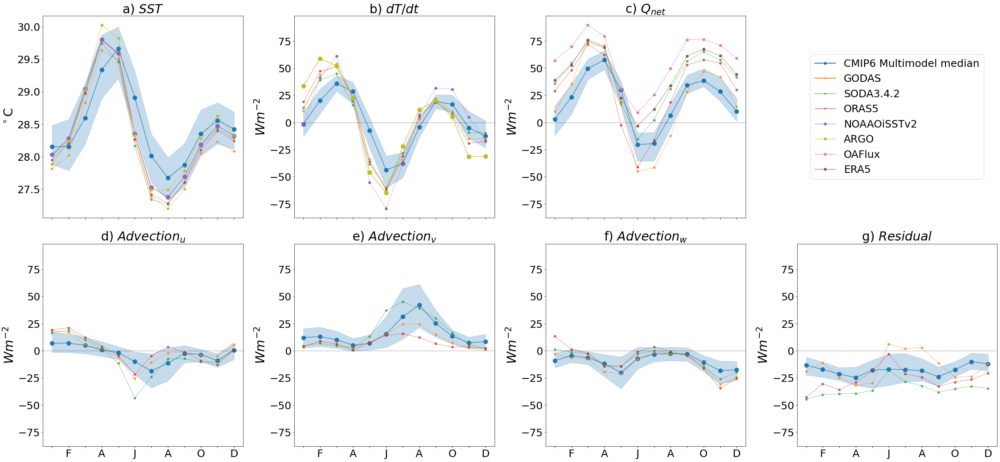

In [41]:
plt.rcParams.update({'font.size': 25})

a = plot_region_MM_new(models1, OBS1, -10, 10, 50, 70)
plt.tight_layout()
#plt.savefig('/home/z5113258/Documents/figures/Paper_23-01-30/F_2.svg', pad_inches = 1, bbox_inches = 'tight')
plt.savefig('/home/z5113258/Documents/figures/Figures_high_res/F_2.png',dpi = 600, pad_inches = 1,  bbox_inches = 'tight', facecolor = 'white')


/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

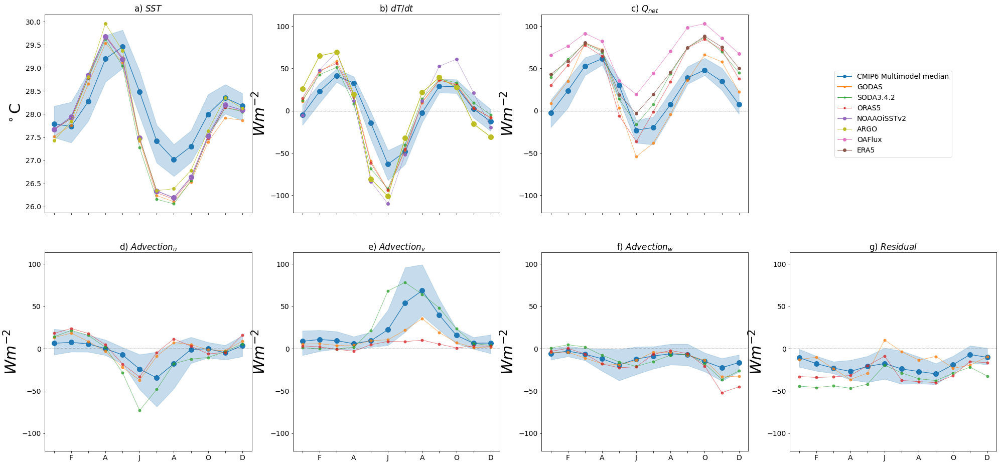

In [13]:
a = plot_region_MM_new(models1, OBS1, -10, 10, 45, 60)


/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

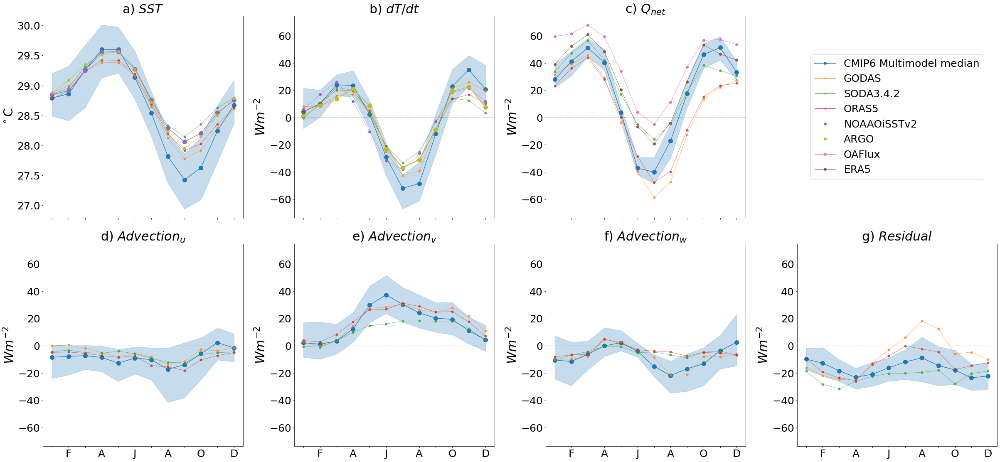

In [42]:
a = plot_region_MM_new(models1, OBS1, -10, 0, 90, 110)
plt.tight_layout()
#plt.savefig('/home/z5113258/Documents/figures/Paper_23-01-30/F_5.svg', pad_inches = 1, bbox_inches = 'tight')
plt.savefig('/home/z5113258/Documents/figures/Figures_high_res/F_5.png', dpi = 600,pad_inches = 1,  bbox_inches = 'tight', facecolor = 'white')


/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

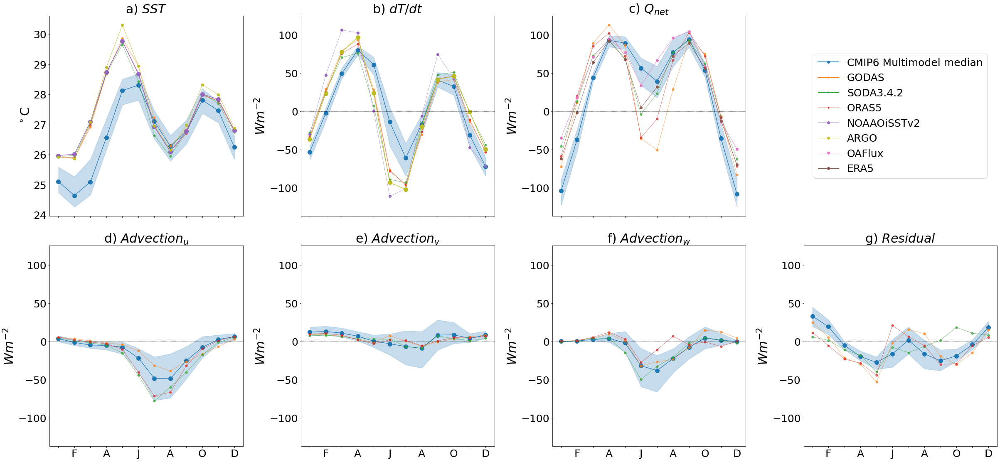

In [43]:
a = plot_region_MM_new(models1, OBS1, 10, 20, 50, 70)
plt.tight_layout()
#plt.savefig('/home/z5113258/Documents/figures/Paper_23-01-30/F_7.svg', pad_inches = 1, bbox_inches = 'tight')
plt.savefig('/home/z5113258/Documents/figures/Figures_high_res/F_7.png', dpi = 600, pad_inches = 1,  bbox_inches = 'tight', facecolor = 'white')


/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

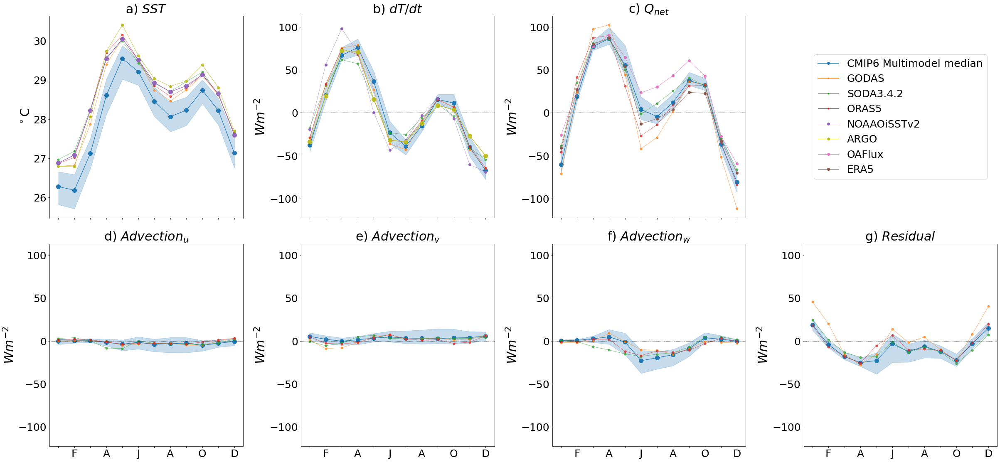

In [44]:
a = plot_region_MM_new(models1, OBS1, 10, 20, 80, 100)#Bay of Bengal
plt.tight_layout()
#plt.savefig('/home/z5113258/Documents/figures/Paper_23-01-30/F_7.svg', pad_inches = 1, bbox_inches = 'tight')
plt.savefig('/home/z5113258/Documents/figures/Figures_high_res/SF_BOB.png', dpi = 600, pad_inches = 1,  bbox_inches = 'tight', facecolor = 'white')


In [17]:
#create a 'model-series' for each variable
TM, UM, VM, WM, QM, RM, SM = get_model_TS(models1)
TO, UO, VO, WO, QO, RO, SO = get_model_TS(OBS1)

In [36]:
TM, UM, VM, WM, QM, RM, SM = get_model_TS(models1)
TO, UO, VO, WO, QO, RO, SO = get_model_TS(OBS1)

#Now calculate the multimodel means/
TMM = TM.median(dim = 'model')
UMM = UM.median(dim = 'model')
VMM = VM.median(dim = 'model')
WMM = WM.median(dim = 'model')
QMM = QM.median(dim = 'model')
RMM = RM.median(dim = 'model')
SMM = SM.median(dim = 'model')
TAM = get_region((TMM*(3986*1026*50)), 10, 20, 80, 100).mean('month')
UAM = get_region((UMM*(3986*1026*50)), 10, 20, 80, 100).mean('month')
VAM = get_region((VMM*(3986*1026*50)), 10, 20, 80, 100).mean('month')
WAM = get_region((WMM*(3986*1026*50)), 10, 20, 80, 100).mean('month')
QAM = get_region((QMM*(3986*1026*50)), 10, 20, 80, 100).mean('month')
RAM = get_region((RMM*(3986*1026*50)), 10, 20, 80, 100).mean('month')
SAM = get_region((SMM*(3986*1026*50)), 10, 20, 80, 100).mean('month')
print(TAM.values, UAM.values, VAM.values, WAM.values, QAM.values, RAM.values)

0.3580215254334493 -1.9889571620391957 3.2735030381728 -4.5687688493054175 11.762262997892629 -8.023265475275453


In [28]:
UAM.values+ VAM.values+ WAM.values+ QAM.values+ RAM.values

0.6883129094437939

In [37]:
get_region((E5Q), 10, 20, 80, 100).mean('month')

<xarray.DataArray ()>
array(11.189606, dtype=float32)

In [38]:
TAM = get_region((TO*(3986*1026*50)), 10, 20, 80, 100).mean('month')
UAM = get_region((UO*(3986*1026*50)), 10, 20, 80, 100).mean('month')
VAM = get_region((VO*(3986*1026*50)), 10, 20, 80, 100).mean('month')
WAM = get_region((WO*(3986*1026*50)), 10, 20, 80, 100).mean('month')
QAM = get_region((QO*(3986*1026*50)), 10, 20, 80, 100).mean('month')
RAM = get_region((RO*(3986*1026*50)), 10, 20, 80, 100).mean('month')
SAM = get_region((SO*(3986*1026*50)), 10, 20, 80, 100).mean('month')
print(TAM, UAM, VAM, WAM, QAM, RAM)
#print(UAM.values+ VAM.values+ WAM.values+ QAM.values+ RAM.values)

<xarray.DataArray 'pottmp' (model: 3)>
array([0.6543564 , 0.38015663, 0.45381829])
Coordinates:
  * model    (model) <U9 'GODAS' 'SODA3.4.2' 'ORAS5' <xarray.DataArray (model: 3)>
array([-1.74163635, -2.0473816 , -0.73275188])
Coordinates:
  * model    (model) <U9 'GODAS' 'SODA3.4.2' 'ORAS5' <xarray.DataArray (model: 3)>
array([1.0872084 , 2.08247909, 1.21198071])
Coordinates:
  * model    (model) <U9 'GODAS' 'SODA3.4.2' 'ORAS5' <xarray.DataArray (model: 3)>
array([-3.79198935, -6.31529916, -5.26706519])
Coordinates:
    lev      int64 50
  * model    (model) <U9 'GODAS' 'SODA3.4.2' 'ORAS5' <xarray.DataArray (model: 3)>
array([ 2.77678681, 18.6268059 ,  9.73323825])
Coordinates:
  * model    (model) <U9 'GODAS' 'SODA3.4.2' 'ORAS5' <xarray.DataArray (model: 3)>
array([ 3.24741189, -7.38258635, -5.5560521 ])
Coordinates:
    lev      int64 50
  * model    (model) <U9 'GODAS' 'SODA3.4.2' 'ORAS5'


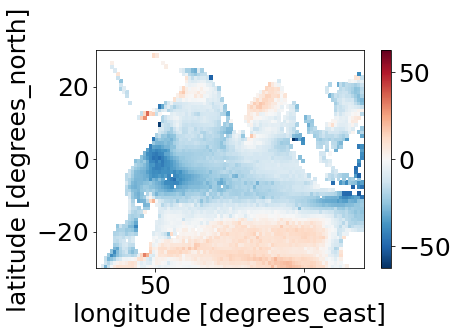

In [87]:
(QM.mean("month").mean("model")*(3986*1026*50) -
 E5Q.mean('month')).sel(lat = slice(-30,30), lon = slice(30,120)).plot()

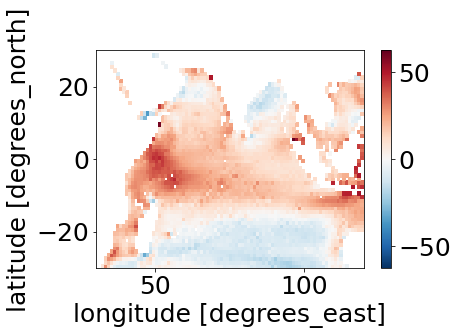

In [83]:
((E5Q.sel(lat = slice(-30,30), lon = slice(30,120)).mean("month"))-
             (QM.sel(lat = slice(-30,30), lon = slice(30,120)).mean("month"
                    ).mean("model")*(3986*1026*50))).plot()#vmin = -50, vmax = 50, cmap = 'bwr')


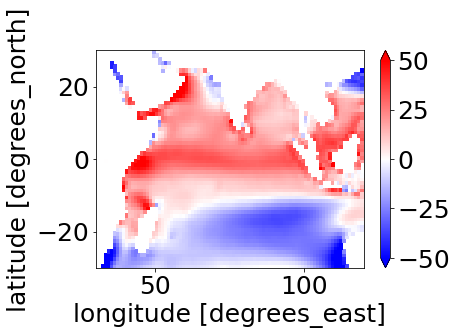

In [69]:
(QM.sel(lat = slice(-30,30), lon = slice(30,120)).mean("month").mean("model")*(3986*1026*50)).plot(vmin = -50, vmax = 50, cmap = 'bwr')

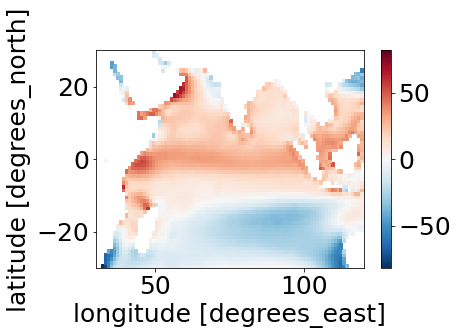

In [59]:
(QM.sel(lat = slice(-30,30), lon = slice(30,120)).mean("month").mean("model")*(3986*1026*50)).plot()#vmin = -100, vmax = 100, cmap = 'bwr')

In [41]:
#figures 2,5 and 7 stop here.
##
#

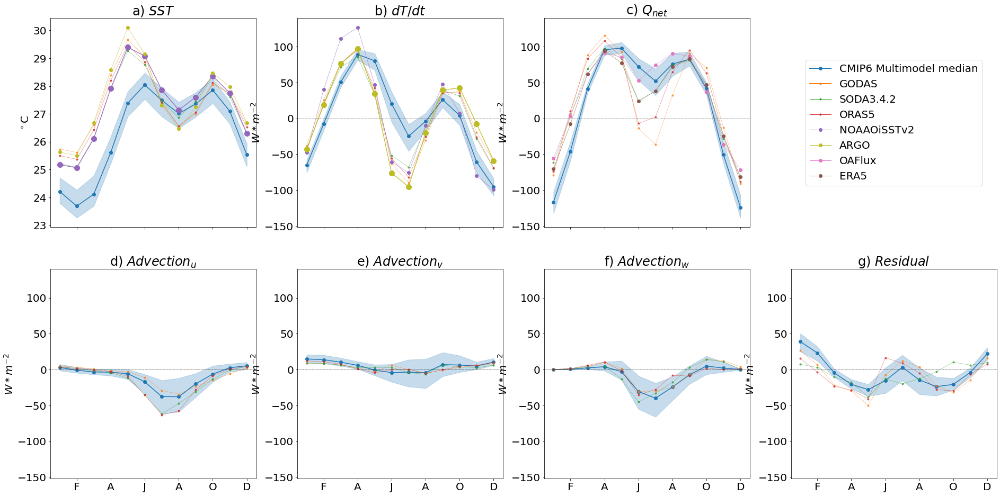

In [22]:
a = plot_region_MM_new(models1, OBS1, 10, 30, 50, 70)#see how different this region is compared to smaller above

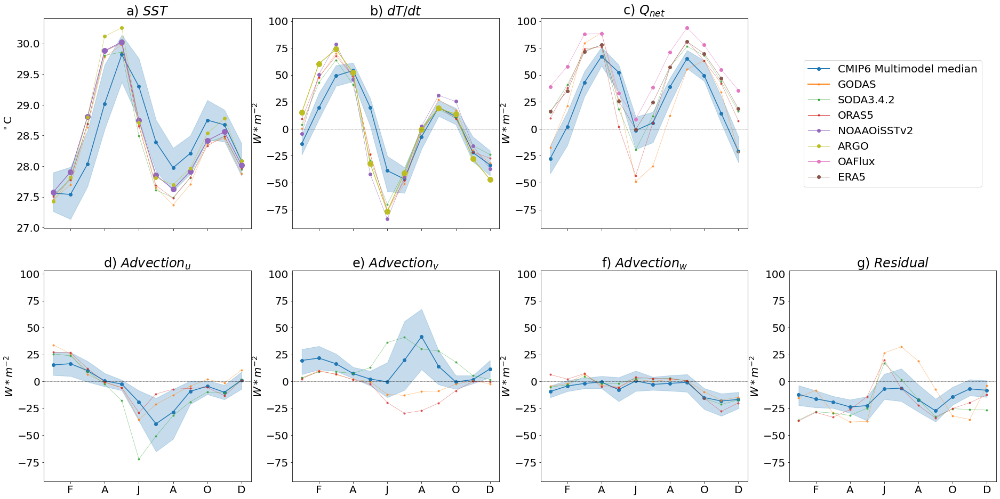

In [23]:
a = plot_region_MM_new(models1, OBS1, 0, 10, 50, 70)#NWTIO

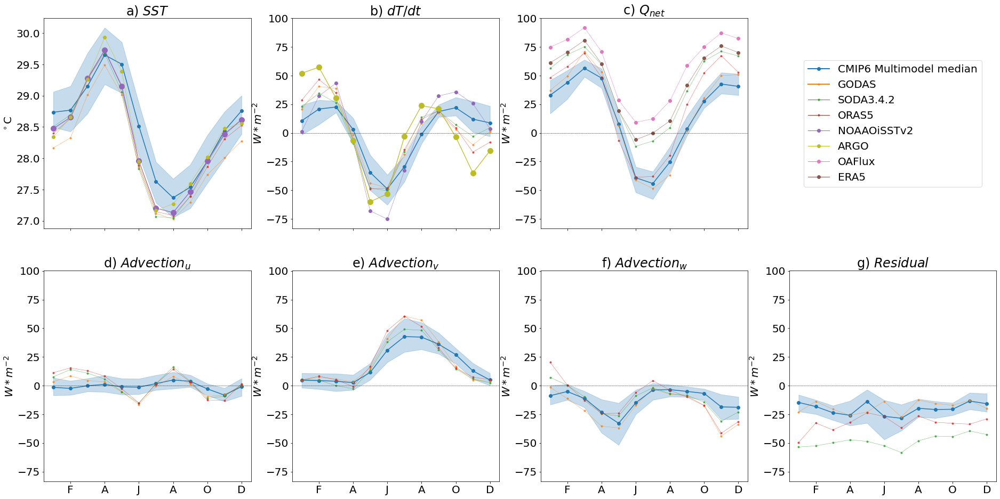

In [24]:
a = plot_region_MM_new(models1, OBS1, -10, 0, 50, 70)#sWTIO

Now we make figure 3. Start just with zonal advection and zonal terms to make the figure then do 9 panels

In [22]:
#load in the zonal advection term, zonal current and zonal temperatrure gradient
#lok at temp gradients and currents
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/CMIP6_HB_new/'
#dict with file names
varis = {'dtdx':'_dtx.nc', 'dtdy':'_dty.nc', 'dtdz':'_dtz.nc',
             'wcur':'_wcur.nc', 'vcur':'_vcur.nc', 'ucur':'_ucur.nc', 
             'ua':'_u_advection.nc', 'va':'_v_advection.nc', 'wa':'_w_advection.nc'}
models2={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                if key == 'wcur':
                    var = var.groupby('time.month').mean('time')
                #put into dict
                mod[key]=var
                models2[model] = mod
            except Exception as e:
                print(e)
                pass
        #now append data to model dict


[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_dtx.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_dty.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_dtz.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_wcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_vcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_ucur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_u_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_v_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_w_advection.nc'


In [23]:
#load in observation componenets/advection
#lok at temp gradients and currents
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/REAN_HB/'
#dict with file names
varis = {'dtdx':'_dtx.nc', 'dtdy':'_dty.nc', 'dtdz':'_dtz.nc',
             'wcur':'_wcur.nc', 'vcur':'_vcur.nc', 'ucur':'_ucur.nc',
                'ua':'_u_advection.nc', 'va':'_v_advection.nc', 'wa':'_w_advection.nc'}
OBS2={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                #if key == 'wcur':
                #    var = var.groupby('time.month').mean('time')
                #put into dict
                mod[key]=var
                OBS2[model] = mod
            except Exception as e:
                print(e)
                pass
        #now append data to model dict


[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_dtx.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_dty.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_dtz.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_wcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_vcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_ucur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_u_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_v_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_w_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/

In [24]:
#fucntion to create regional plots for multimodel mean of each variable
def plot_region_cur_dt(MM_D, OB_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdx']
        ty=HB['dtdy']
        tz=HB['dtdz']
        u=HB['ucur']
        v=HB['vcur']
        w=HB['wcur']
        ua=HB['ua']
        va=HB['va']
        wa=HB['wa']
        #now turn all these variables into an array
        if i == 0:
            txm = tx
            tym = ty
            tzm = tz
            um = u
            vm = v
            wm = w
            uam = ua
            vam = va
            wam = wa
        else:
            txm = xr.concat([txm, tx], dim = 'model')
            tym = xr.concat([tym, ty], dim = 'model')
            tzm = xr.concat([tzm, tz], dim = 'model')
            um = xr.concat([um, u], dim = 'model')
            vm = xr.concat([vm, v], dim = 'model')
            wm = xr.concat([wm, w], dim = 'model')
            uam = xr.concat([uam, ua], dim = 'model')
            vam = xr.concat([vam, va], dim = 'model')
            wam = xr.concat([wam, wa], dim = 'model')

    #Now calculate the multimodel medians
    txmm = txm.median(dim = 'model')
    tymm = tym.median(dim = 'model')
    tzmm = tzm.median(dim = 'model')
    umm = um.median(dim = 'model')
    vmm = vm.median(dim = 'model')
    wmm = wm.median(dim = 'model')
    uamm = uam.median(dim = 'model')
    vamm = vam.median(dim = 'model')
    wamm = wam.median(dim = 'model')

    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 18), sharex='all')
    fig.set_facecolor('white')

    axes[0,0].plot(range(1,13), get_region((txmm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'dtdx')
    axes[1,0].plot(range(1,13), get_region((tymm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'dtdy')
    axes[2,0].plot(range(1,13), get_region((tzmm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'dtdz')
    axes[0,1].plot(range(1,13), get_region((umm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'u')
    axes[1,1].plot(range(1,13), get_region((vmm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'v')
    axes[2,1].plot(range(1,13), get_region((wmm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'w')
    #plot advection
    axes[0,2].plot(range(1,13), get_region((uamm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'uadv')
    axes[1,2].plot(range(1,13), get_region((vamm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'vadv')
    axes[2,2].plot(range(1,13), get_region((wamm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'wadv')
    #plot U*dt/dx
    axes[0,2].plot(range(1,13), get_region((umm*txmm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = '[u*dtdx] area avg')
    axes[1,2].plot(range(1,13), get_region((vmm*tymm), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = '[v*dtdy] area avg')
    axes[2,2].plot(range(1,13), get_region((wmm*tzmm), lat, lat_r, lon, lon_r), linestyle='-', marker='o',label = '[w*dtdz] area avg')
    
    axes[0,2].plot(range(1,13), get_region((umm), lat, lat_r, lon, lon_r)*get_region((txmm), lat, lat_r, lon, lon_r),
                   linestyle='-', marker='o',label = '[u]area avg *[dtdx] area avg')
    axes[1,2].plot(range(1,13), get_region((vmm), lat, lat_r, lon, lon_r)*get_region((tymm), lat, lat_r, lon, lon_r),
                   linestyle='-', marker='o',label = '[v]area avg *[dtdy] area avg')
    axes[2,2].plot(range(1,13), get_region((wmm), lat, lat_r, lon, lon_r)*get_region((tzmm), lat, lat_r, lon, lon_r),
                   linestyle='-', marker='o',label = '[w]area avg *[dtdz] area avg')

    
    #plot the 0 line
    axes[0,0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[0,1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[0,2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[2,0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[2,1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[2,2].axhline(0, c='k', ls = '--', lw = 0.5)


    
    
    #plot rean
    for ob in OB_D.keys():
        #get_region(obs[ob]['tx'], lat, lat1, lon, lon1).plot(label = ob)
            axes[0,0].plot(range(1,13), get_region((OB_D[ob]['dtdx']), lat, lat_r, lon, lon_r),
                           linestyle='--', marker='o', label = ob)
            axes[1,0].plot(range(1,13), get_region((OB_D[ob]['dtdy']), lat, lat_r, lon, lon_r),
                           linestyle='--', marker='o', label = ob)
            axes[2,0].plot(range(1,13), get_region((OB_D[ob]['dtdz']), lat, lat_r, lon, lon_r),
                           linestyle='--', marker='o', label = ob)
            axes[0,1].plot(range(1,13), get_region((OB_D[ob]['ucur']), lat, lat_r, lon, lon_r),
                           linestyle='--', marker='o', label = ob)
            axes[1,1].plot(range(1,13), get_region((OB_D[ob]['vcur']), lat, lat_r, lon, lon_r),
                           linestyle='--', marker='o', label = ob)
            axes[2,1].plot(range(1,13), get_region((OB_D[ob]['wcur']), lat, lat_r, lon, lon_r),
                           linestyle='--', marker='o', label = ob)
            #plot advection
            #axes[0,2].plot(range(1,13), get_region((OB_D[ob]['ua']), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'uadv')
            #axes[1,2].plot(range(1,13), get_region((OB_D[ob]['va']), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'vadv')
            #axes[2,2].plot(range(1,13), get_region((OB_D[ob]['wa']), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = 'wadv')
            #plot U*dt/dx
            #axes[0,2].plot(range(1,13), get_region((OB_D[ob]['dtdx']*OB_D[ob]['ucur']), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = '[u*dtdx] area avg')
            #axes[1,2].plot(range(1,13), get_region((OB_D[ob]['dtdy']*OB_D[ob]['vcur']), lat, lat_r, lon, lon_r),linestyle='-', marker='o', label = '[v*dtdy] area avg')
            #axes[2,2].plot(range(1,13), get_region((OB_D[ob]['dtdz']*OB_D[ob]['wcur']), lat, lat_r, lon, lon_r), linestyle='-', marker='o',label = '[w*dtdz] area avg')

    #now plot ranges
    axes[0,0].fill_between(range(1,13), get_region(((txm.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((txm.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[1,0].fill_between(range(1,13), get_region(((tym.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                     get_region(((tym.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[2,0].fill_between(range(1,13), get_region(((tzm.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((tzm.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[0,1].fill_between(range(1,13), get_region(((um.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((um.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[1,1].fill_between(range(1,13), get_region(((vm.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((vm.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[2,1].fill_between(range(1,13), get_region(((wm.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((wm.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[0,0].set_title('a) $dT/dx$')
    axes[1,0].set_title('d) $dT/dy$')
    axes[2,0].set_title('g) $dT/dz$')
    axes[0,1].set_title('b) U current')
    axes[1,1].set_title('e) V current')
    axes[2,1].set_title('h) W current')
    axes[0,2].set_title('c) U Advection')
    axes[1,2].set_title('f) V Advection')
    axes[2,2].set_title('i) W Advection')
    #axes[0,2].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[1,2].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[2,2].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    handles, labels = [(a + b) for a, b in zip((axes[0,0]).get_legend_handles_labels(), (axes[0,2]).get_legend_handles_labels())]
    axes[0,2].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')
    
    return fig

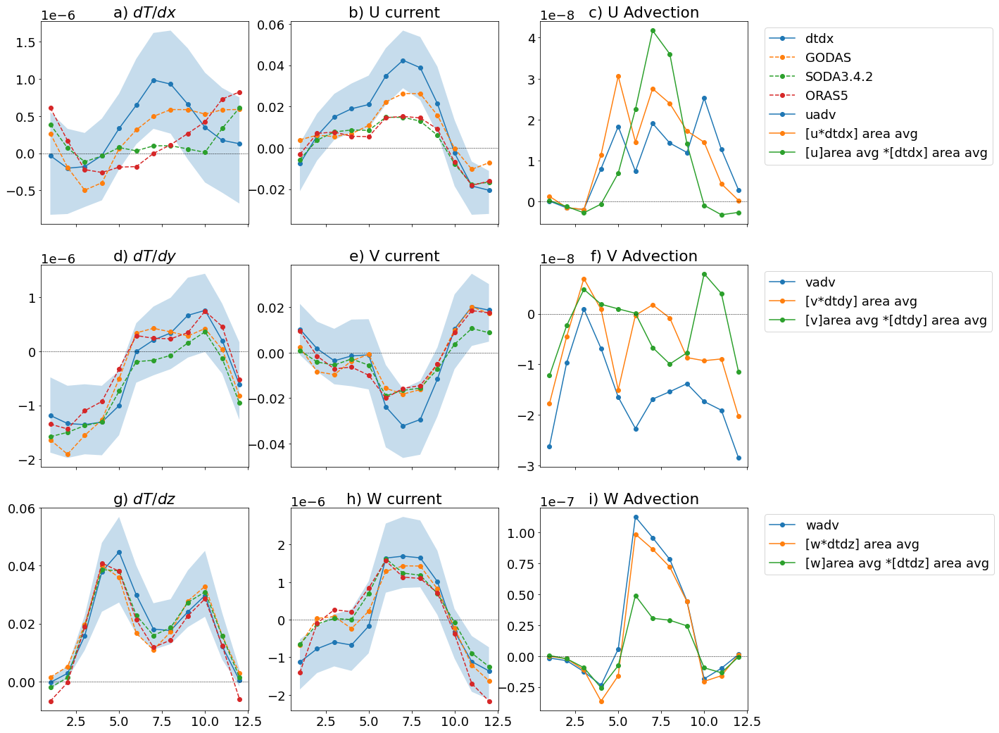

In [25]:
fig = plot_region_cur_dt(models2, OBS2, 10, 20, 80,100)

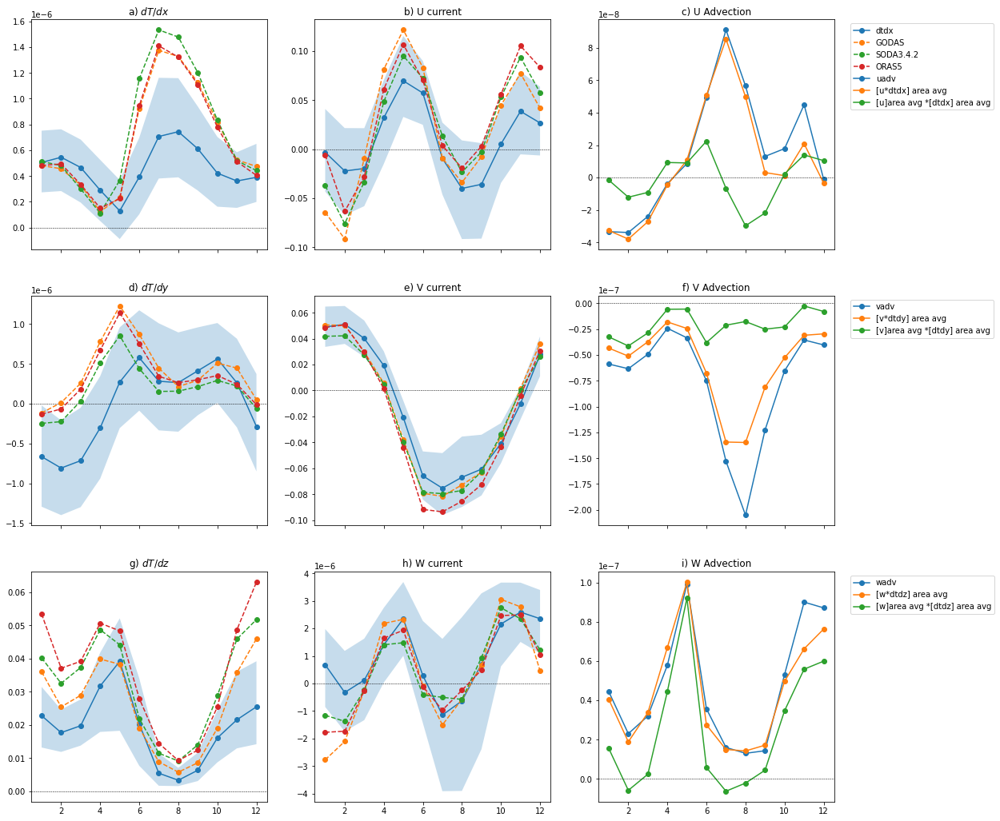

In [19]:
fig = plot_region_cur_dt(models2, OBS2, -10, 10, 50,70)

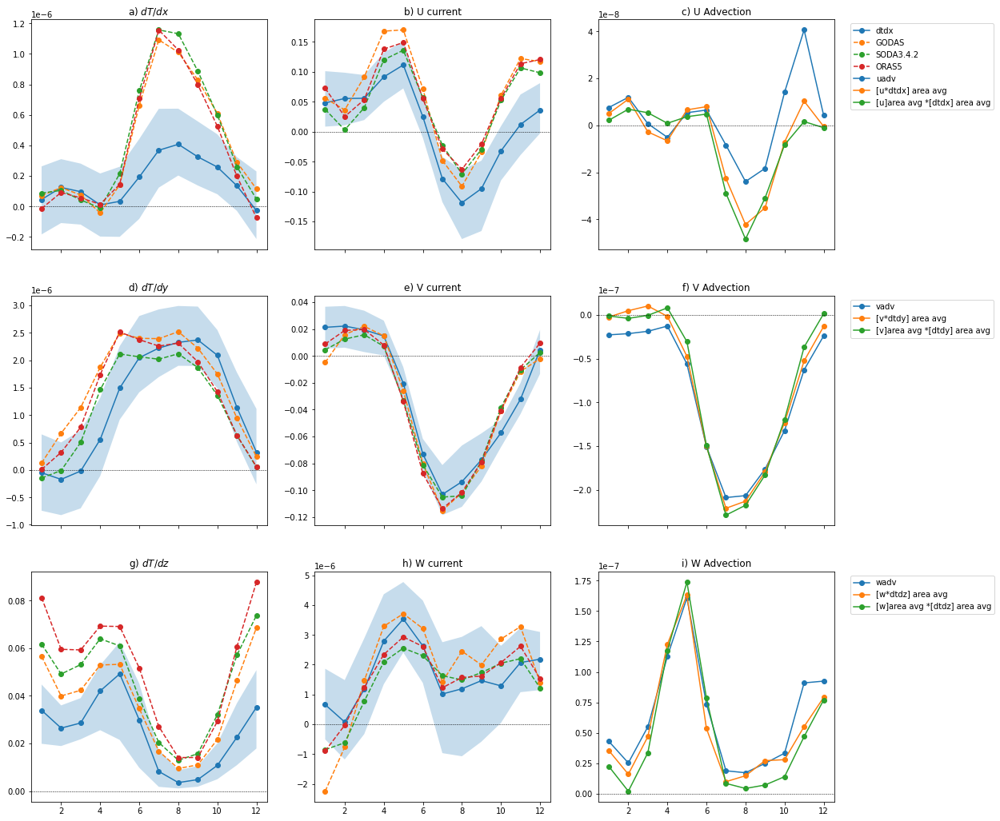

In [18]:
fig = plot_region_cur_dt(models2, OBS2, -10, 0, 50,70)

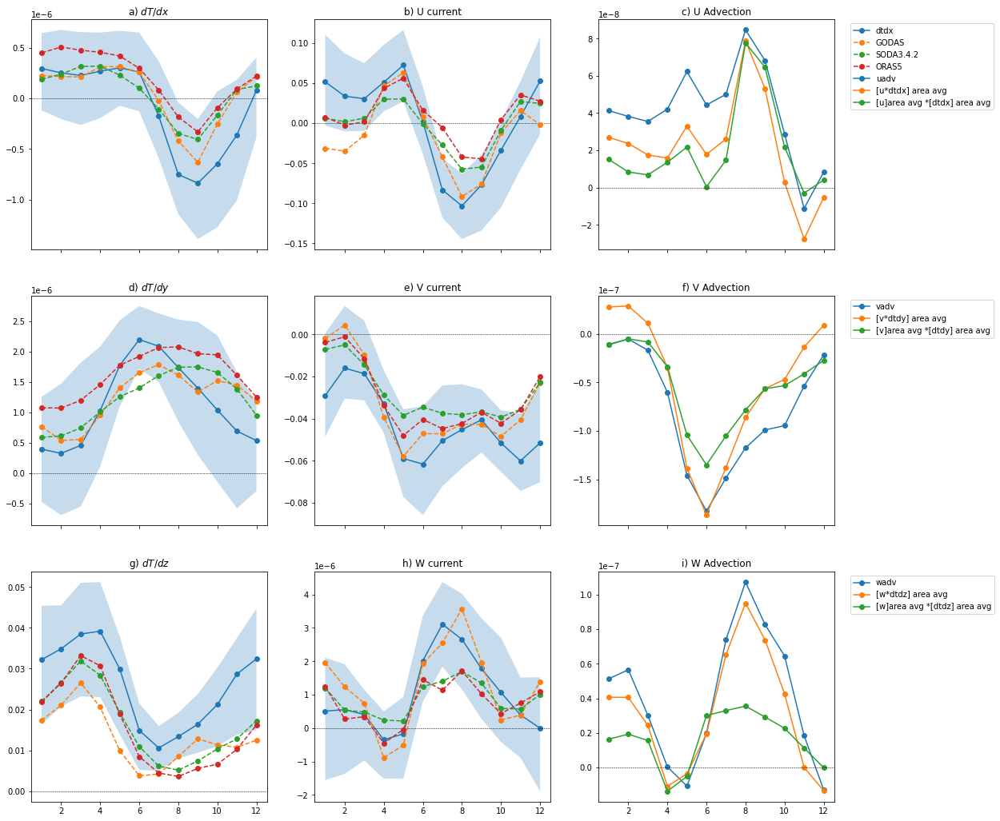

In [222]:
fig = plot_region_cur_dt(models2, OBS2, -10, 0, 90, 110)

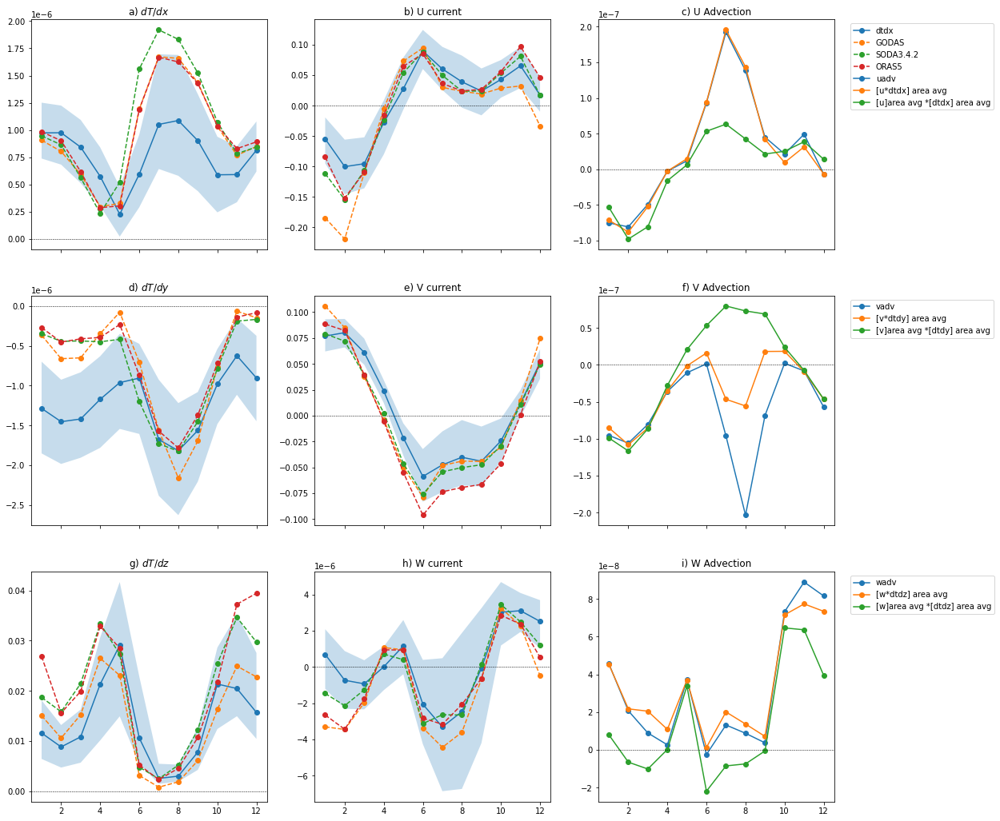

In [19]:
fig = plot_region_cur_dt(models2, OBS2, 0, 10, 50,70)

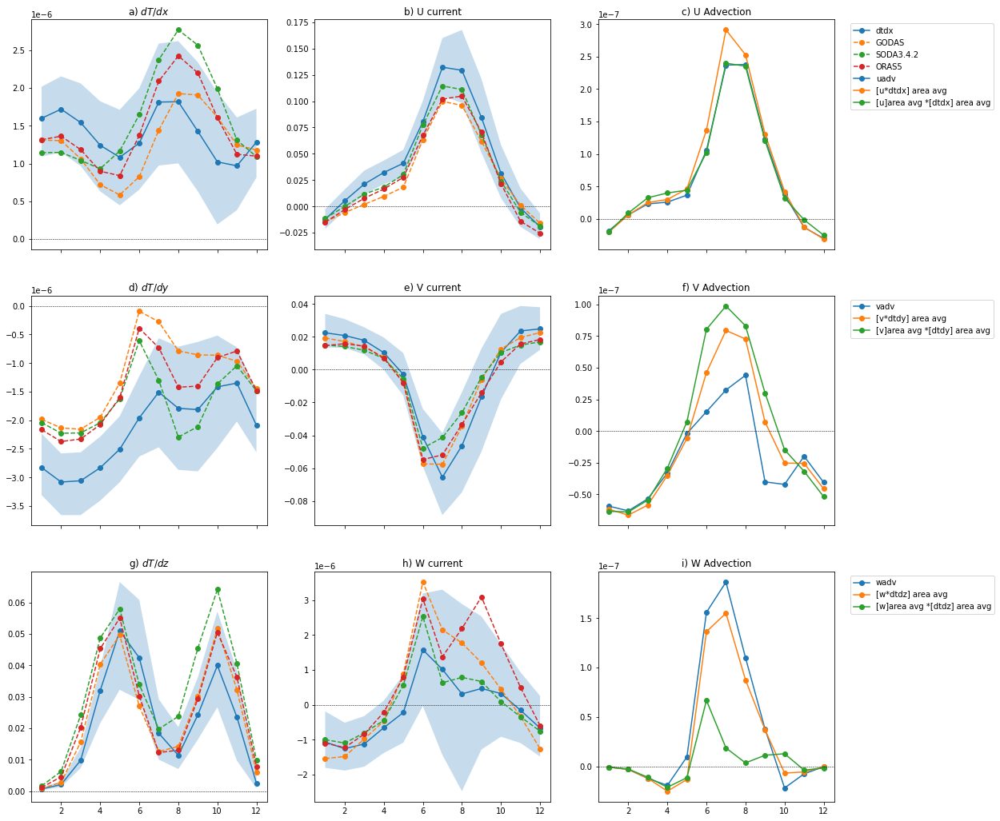

In [55]:
fig = plot_region_cur_dt(models2, OBS2, 10, 20, 50, 70)

In [19]:
def plot_testnew(MM_D):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdx']
        ty=HB['dtdy']
        tz=HB['dtdz']
        u=HB['ucur']
        v=HB['vcur']
        w=HB['wcur']
        ua=HB['ua']
        va=HB['va']
        wa=HB['wa']
        #now turn all these variables into an array
        if i == 0:
            txm = tx
            tym = ty
            tzm = tz
            um = u
            vm = v
            wm = w
            uam = ua
            vam = va
            wam = wa
        else:
            txm = xr.concat([txm, tx], dim = 'model')
            tym = xr.concat([tym, ty], dim = 'model')
            tzm = xr.concat([tzm, tz], dim = 'model')
            um = xr.concat([um, u], dim = 'model')
            vm = xr.concat([vm, v], dim = 'model')
            wm = xr.concat([wm, w], dim = 'model')
            uam = xr.concat([uam, ua], dim = 'model')
            vam = xr.concat([vam, va], dim = 'model')
            wam = xr.concat([wam, wa], dim = 'model')

    #Now calculate the multimodel medians
    txmm = txm.median(dim = 'model')
    tymm = tym.median(dim = 'model')
    tzmm = tzm.median(dim = 'model')
    umm = um.median(dim = 'model')
    vmm = vm.median(dim = 'model')
    wmm = wm.median(dim = 'model')
    uamm = uam.median(dim = 'model')
    vamm = vam.median(dim = 'model')
    wamm = wam.median(dim = 'model')

    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    #fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 18), sharex='all')
    #fig.set_facecolor('white')
    fig = txmm.plot.contourf(col='month', col_wrap = 4,  transform=ccrs.PlateCarree(),
                             subplot_kws={"projection": ccrs.PlateCarree()}, 
                              figsize=(16,8), vmin = -5e-6, vmax = 5e-6,
                            levels =7,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                cbar_kwargs=dict(label='temp gradient ($^\circ$C)')) 
    #Add in features
    for i, ax in enumerate(fig.axes.flat):
        CS = ax.contour(umm.lon, umm.lat, umm[i],  colors = 'k', levels = [-0.5,-0.4,-0.3,-0.2,-0.1,0, 0.1, 0.2, 0.3, 0.4, 0.5], linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=True,  fontsize=8)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2,3,4,5,6,7]:
            gl.bottom_labels = False
        if i in [1,2,3,5,6,7,9,10,11]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        
    fig1 = tymm.plot.contourf(col='month', col_wrap = 4,  transform=ccrs.PlateCarree(),
                             subplot_kws={"projection": ccrs.PlateCarree()}, 
                              figsize=(16,8), vmin = -5e-6, vmax = 5e-6,
                            levels =11,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                cbar_kwargs=dict(label='temp gradient ($^\circ$C)')) 
    #Add in features
    for i, ax in enumerate(fig1.axes.flat):
        CS = ax.contour(vmm.lon, vmm.lat, vmm[i],  colors = 'k', levels = 7, linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=True,  fmt='%1.2f',  fontsize=8)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2,3,4,5,6,7]:
            gl.bottom_labels = False
        if i in [1,2,3,5,6,7,9,10,11]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        
    fig2 = tzmm.plot.contourf(col='month', col_wrap = 4,  transform=ccrs.PlateCarree(),
                             subplot_kws={"projection": ccrs.PlateCarree()}, 
                              figsize=(16,8), vmin = -0.12, vmax = 0.12,
                            levels =14,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                cbar_kwargs=dict(label='temp gradient ($^\circ$C)')) 
    #Add in features
    for i, ax in enumerate(fig2.axes.flat):
        CS = ax.contour(umm.lon, umm.lat, umm[i],  colors = 'k', levels = 7, linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=True,  fmt='%1.2f',  fontsize=8)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2,3,4,5,6,7]:
            gl.bottom_labels = False
        if i in [1,2,3,5,6,7,9,10,11]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
    return fig, fig1, fig2

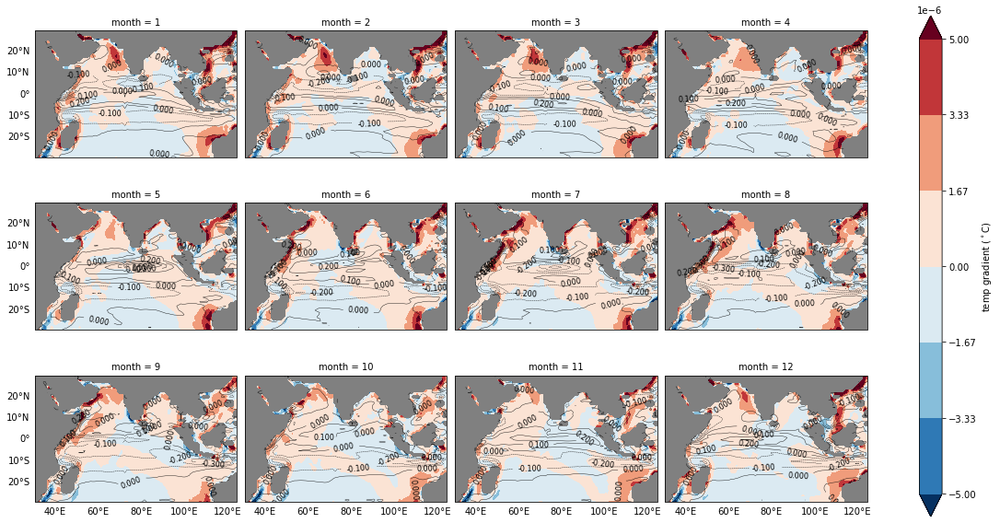

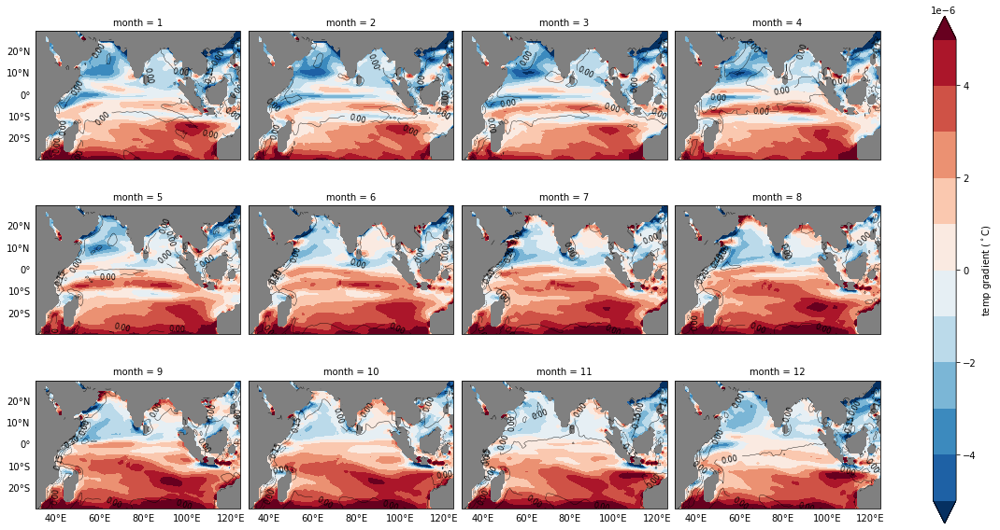

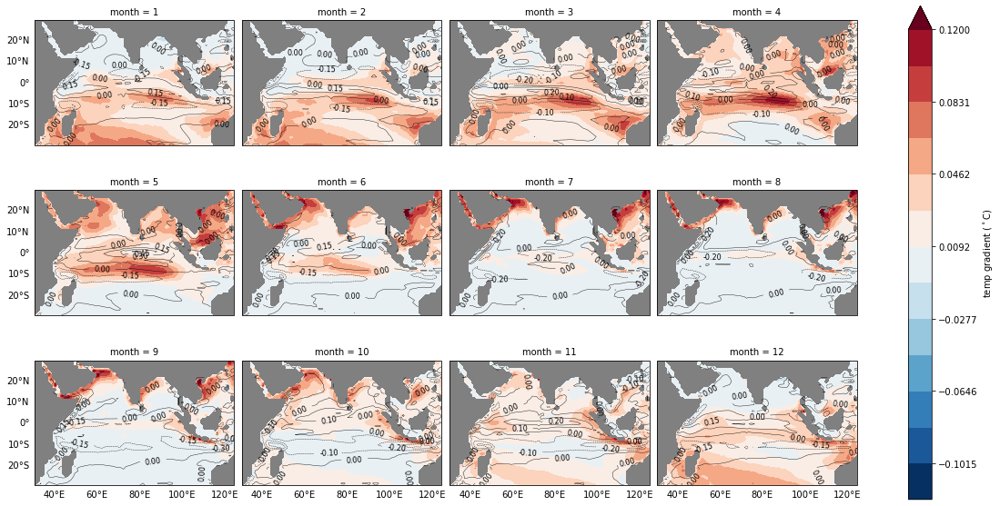

In [25]:
u,v,w = plot_testnew(models2)

In [218]:
#fucntion to make array of signifcance when models agree on sign
def sign_sig(arr):
    pos = xr.where(arr>0, 1,0)
    neg = xr.where(arr<0, 1,0)
    #get where majority of cells agree on sign, ie, at least 15/20
    pos_ = pos.sum('model')
    pos_ = xr.where(pos_ >= 15, 1, 0)

    neg_ = neg.sum('model')
    neg_ = xr.where(neg_ >= 15, 1, 0)
    sigbias = xr.where((pos_+neg_)==1, np.nan, 1)
    return sigbias

/home/z5113258/anaconda3/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


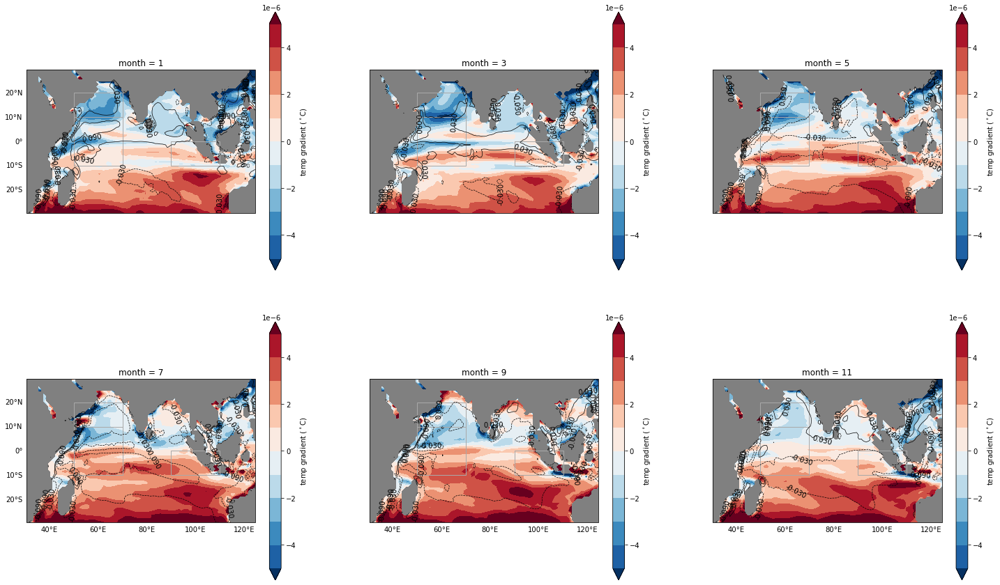

In [219]:
from matplotlib import ticker
fmt = ticker.FormatStrFormatter('%.2e')
def plot_testnew(MM_D):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdy']
       
        u=HB['vcur']

        #now turn all these variables into an array
        if i == 0:
            txm = tx

            um = u

        else:
            txm = xr.concat([txm, tx], dim = 'model')
            
            um = xr.concat([um, u], dim = 'model')
            
    #Now calculate the multimodel medians
    txmm = txm.median(dim = 'model')
    umm = um.median(dim = 'model')
    #calc agrrement on sihgn
    tx_sig = sign_sig(txm)
    um_sig = sign_sig(um)


    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT

        
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25, 15), sharex='all',
                             subplot_kw={"projection": ccrs.PlateCarree()})
    fig.set_facecolor('white')
    for i, ax in enumerate(axes.reshape(-1)):
        fmt.create_dummy_axis()
        txmm[2*i].plot.contourf(#transform=ccrs.PlateCarree(),
                                 #subplot_kws={"projection": ccrs.PlateCarree()}, 
                                  vmin = -5e-6, vmax = 5e-6,
                                levels =11,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                    cbar_kwargs=dict(label='temp gradient ($^\circ$C)'), ax = ax)
        CS = umm[2*i].plot.contour(levels =[-0.09, -0.03, 0.03,0.09],
                                              colors = 'k', linewidths = 0.7, negative_linestyles = '..', ax = ax)
        
        #tx_sig[2*i].plot.contourf(levels = [1,2], colors='none', hatches=['/',None], ax = ax, add_colorbar = False)
        #um_sig[2*i].plot.contourf(levels = [1,2], colors='none', hatches=['\\',None], ax = ax, add_colorbar=False)
        
        #CS = ax.contour(vmm.lon, vmm.lat, vmm[i],  colors = 'k', levels = 7, linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=False, fontsize=10)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2]:
            gl.bottom_labels = False
        if i in [1,2,4,5]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        
a = plot_testnew(models2)

/home/z5113258/anaconda3/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


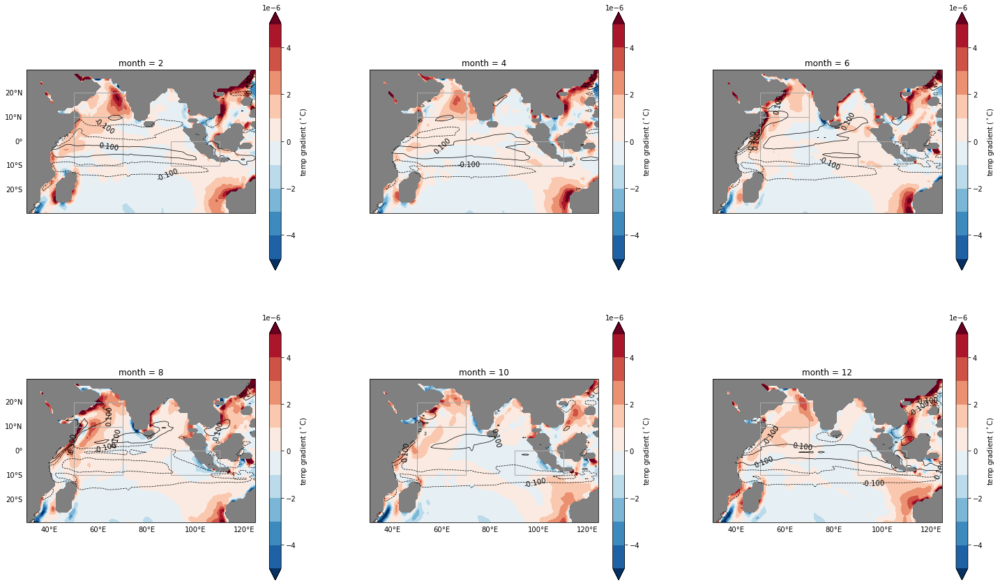

In [71]:
from matplotlib import ticker
fmt = ticker.FormatStrFormatter('%.2e')
def plot_testnew(MM_D):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdx']
       
        u=HB['ucur']

        #now turn all these variables into an array
        if i == 0:
            txm = tx

            um = u

        else:
            txm = xr.concat([txm, tx], dim = 'model')
            
            um = xr.concat([um, u], dim = 'model')
            
    #Now calculate the multimodel medians
    txmm = txm.median(dim = 'model')

    umm = um.median(dim = 'model')


    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT

        
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25, 15), sharex='all',
                             subplot_kw={"projection": ccrs.PlateCarree()})
    fig.set_facecolor('white')
    for i, ax in enumerate(axes.reshape(-1)):
        fmt.create_dummy_axis()
        txmm[2*i+1].plot.contourf(#transform=ccrs.PlateCarree(),
                                 #subplot_kws={"projection": ccrs.PlateCarree()}, 
                                  vmin = -5e-6, vmax = 5e-6,
                                levels =11,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                    cbar_kwargs=dict(label='temp gradient ($^\circ$C)'), ax = ax)
        CS = umm[2*i+1].plot.contour(levels = [-0.3,-0.1,0.1,0.3],
                                              colors = 'k', linewidths = 0.7, negative_linestyles = '..', ax = ax)
    
        #CS = ax.contour(vmm.lon, vmm.lat, vmm[i],  colors = 'k', levels = 7, linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=False, fontsize=10)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2]:
            gl.bottom_labels = False
        if i in [1,2,4,5]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        
a = plot_testnew(models2)

/home/z5113258/anaconda3/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


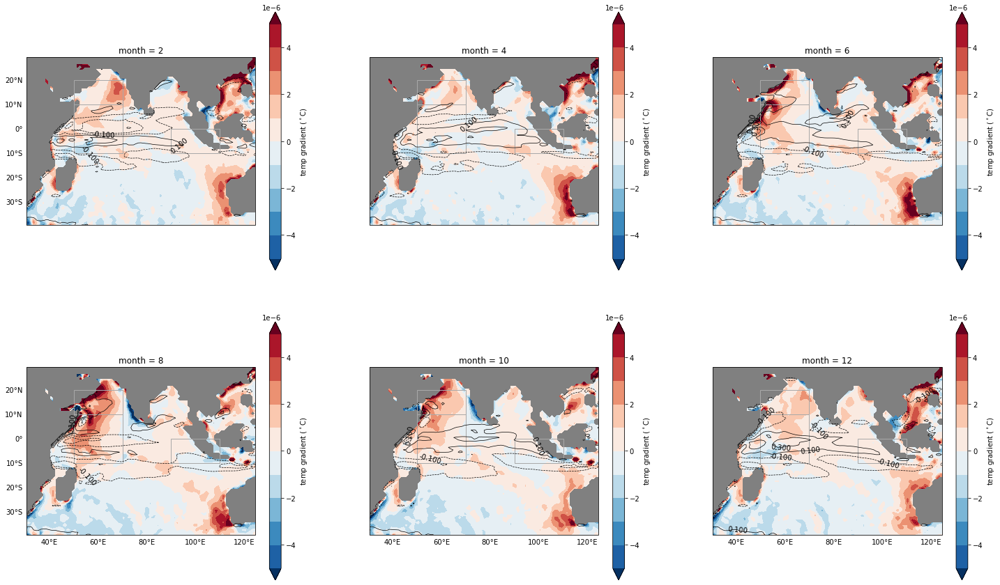

In [88]:
from matplotlib import ticker
fmt = ticker.FormatStrFormatter('%.2e')
def plot_testnew(MM_D):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdx']
        u=HB['ucur']
        #now turn all these variables into an array
        if i == 0:
            txm = tx
            um = u
        else:
            txm = xr.concat([txm, tx], dim = 'model')
            um = xr.concat([um, u], dim = 'model')  
    #Now calculate the multimodel medians
    txmm = txm.median(dim = 'model')
    umm = um.median(dim = 'model')
    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25, 15), sharex='all',
                             subplot_kw={"projection": ccrs.PlateCarree()})
    fig.set_facecolor('white')
    for i, ax in enumerate(axes.reshape(-1)):
        fmt.create_dummy_axis()
        txmm[2*i+1].plot.contourf(#transform=ccrs.PlateCarree(),
                                 #subplot_kws={"projection": ccrs.PlateCarree()}, 
                                  vmin = -5e-6, vmax = 5e-6,
                                levels =11,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                    cbar_kwargs=dict(label='temp gradient ($^\circ$C)'), ax = ax)
        CS = umm[2*i+1].plot.contour(levels = [-0.3,-0.1,0.1,0.3],
                                              colors = 'k', linewidths = 0.7, negative_linestyles = '..', ax = ax)
    
        #CS = ax.contour(vmm.lon, vmm.lat, vmm[i],  colors = 'k', levels = 7, linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=False, fontsize=10)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2]:
            gl.bottom_labels = False
        if i in [1,2,4,5]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        
a = plot_testnew(OBS2)

/home/z5113258/anaconda3/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


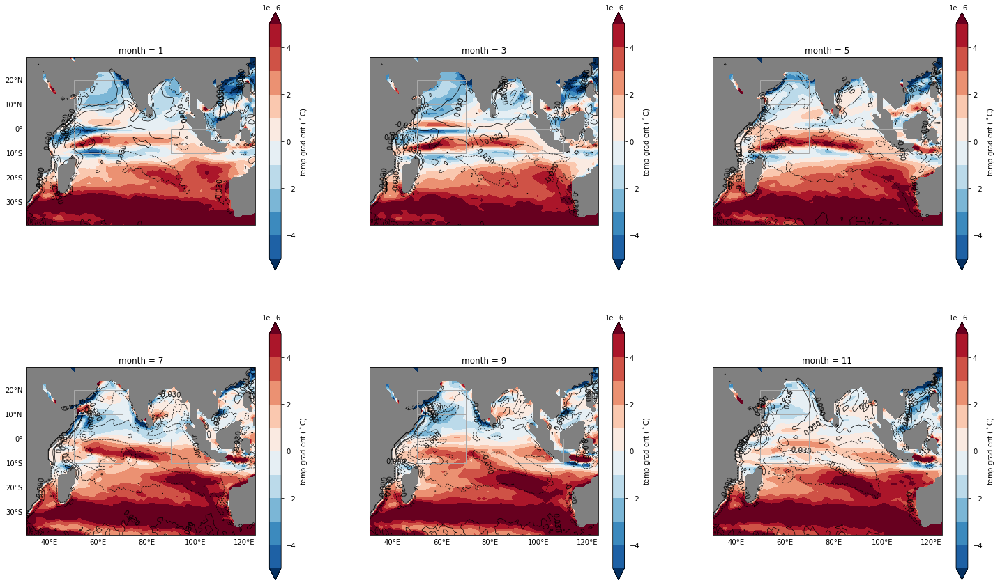

In [20]:
from matplotlib import ticker
fmt = ticker.FormatStrFormatter('%.2e')
def plot_testnew(MM_D):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdy']
        u=HB['vcur']
        #now turn all these variables into an array
        if i == 0:
            txm = tx
            um = u
        else:
            txm = xr.concat([txm, tx], dim = 'model')
            um = xr.concat([um, u], dim = 'model')  
    #Now calculate the multimodel medians
    txmm = txm.median(dim = 'model')
    umm = um.median(dim = 'model')
    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25, 15), sharex='all',
                             subplot_kw={"projection": ccrs.PlateCarree()})
    fig.set_facecolor('white')
    for i, ax in enumerate(axes.reshape(-1)):
        fmt.create_dummy_axis()
        txmm[2*i].plot.contourf(#transform=ccrs.PlateCarree(),
                                 #subplot_kws={"projection": ccrs.PlateCarree()}, 
                                  vmin = -5e-6, vmax = 5e-6,
                                levels =11,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                    cbar_kwargs=dict(label='temp gradient ($^\circ$C)'), ax = ax)
        CS = umm[2*i].plot.contour(levels = [-0.09, -0.03, 0.03,0.09],
                                              colors = 'k', linewidths = 0.7, negative_linestyles = '..', ax = ax)
    
        #CS = ax.contour(vmm.lon, vmm.lat, vmm[i],  colors = 'k', levels = 7, linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=False, fontsize=10)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2]:
            gl.bottom_labels = False
        if i in [1,2,4,5]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        
a = plot_testnew(OBS2)

/home/z5113258/anaconda3/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


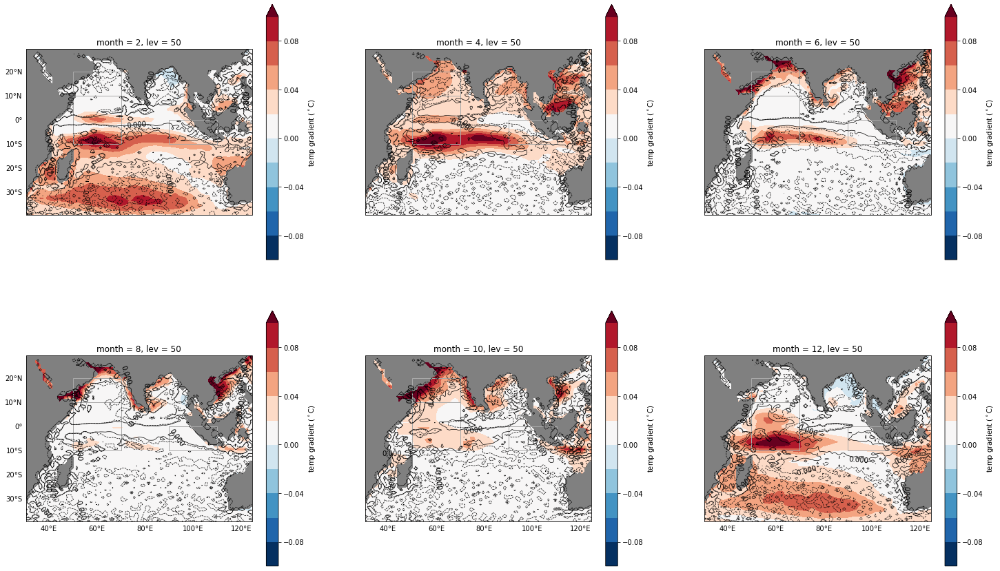

In [26]:
from matplotlib import ticker
fmt = ticker.FormatStrFormatter('%.2e')
def plot_testnew(MM_D):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdz']
       
        u=HB['wcur']

        #now turn all these variables into an array
        if i == 0:
            txm = tx

            um = u

        else:
            txm = xr.concat([txm, tx], dim = 'model')
            
            um = xr.concat([um, u], dim = 'model')
            
    #Now calculate the multimodel medians
    txmm = txm.median(dim = 'model')

    umm = um.median(dim = 'model')


    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT

        
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25, 15), sharex='all',
                             subplot_kw={"projection": ccrs.PlateCarree()})
    fig.set_facecolor('white')
    for i, ax in enumerate(axes.reshape(-1)):
        fmt.create_dummy_axis()
        txmm[2*i+1].plot.contourf(#transform=ccrs.PlateCarree(),
                                 #subplot_kws={"projection": ccrs.PlateCarree()}, 
                                  vmin = -0.1, vmax = 0.1,
                                levels =11,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                    cbar_kwargs=dict(label='temp gradient ($^\circ$C)'), ax = ax)
        CS = umm[2*i+1].plot.contour(levels =[-1e-6,1e-6],
                                              colors = 'k', linewidths = 0.7, negative_linestyles = '..', ax = ax)
    
        #CS = ax.contour(vmm.lon, vmm.lat, vmm[i],  colors = 'k', levels = 7, linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=False, fontsize=10)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2]:
            gl.bottom_labels = False
        if i in [1,2,4,5]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        
a = plot_testnew(OBS2)

/home/z5113258/anaconda3/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]


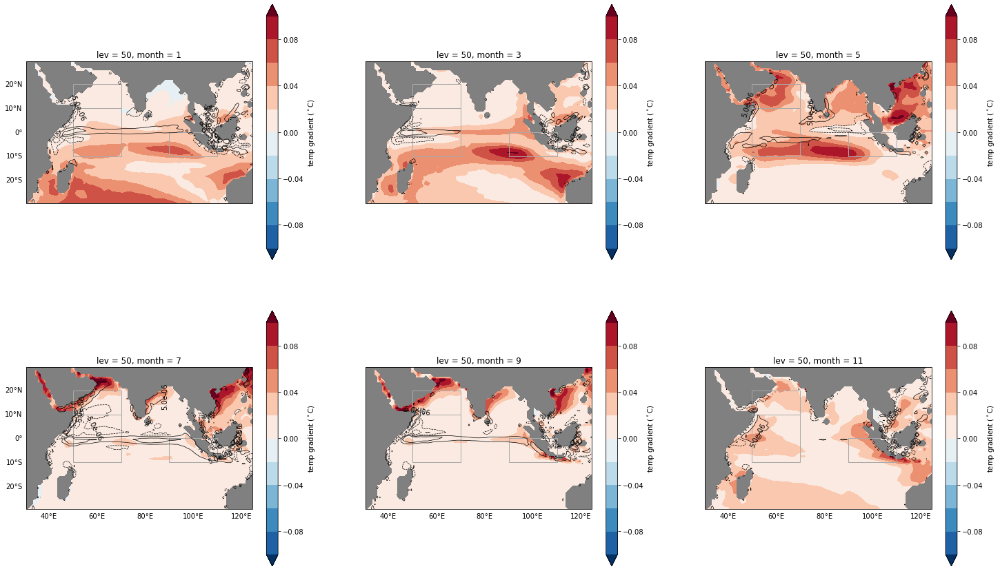

In [135]:
from matplotlib import ticker
#fmt = ticker.FormatStrFormatter('%.2e')
def plot_testnew(MM_D):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdz']
       
        u=HB['wcur']

        #now turn all these variables into an array
        if i == 0:
            txm = tx

            um = u

        else:
            txm = xr.concat([txm, tx], dim = 'model')
            
            um = xr.concat([um, u], dim = 'model')
            
    #Now calculate the multimodel medians
    txmm = txm.median(dim = 'model')

    umm = um.median(dim = 'model')


    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT

        
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25, 15), sharex='all',
                             subplot_kw={"projection": ccrs.PlateCarree()})
    fig.set_facecolor('white')
    for i, ax in enumerate(axes.reshape(-1)):
        fmt.create_dummy_axis()
        txmm[2*i].plot.contourf(#transform=ccrs.PlateCarree(),
                                 #subplot_kws={"projection": ccrs.PlateCarree()}, 
                                  vmin = -0.1, vmax = 0.1,
                                levels =11,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                    cbar_kwargs=dict(label='temp gradient ($^\circ$C)'), extend = 'both', ax = ax)
        CS = (umm)[2*i].plot.contour(levels = [-1.5e-5,-0.5e-5,0.5e-5, 1.5e-5],
                                              colors = 'k', linewidths = 0.7, negative_linestyles = '..', ax = ax)
    
        #CS = ax.contour(vmm.lon, vmm.lat, vmm[i],  colors = 'k', levels = 7, linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=False, fmt='%1.1e', fontsize=10)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2]:
            gl.bottom_labels = False
        if i in [1,2,4,5]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        print (CS.levels)        
a = plot_testnew(models2)

/home/z5113258/anaconda3/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]
[-1.5e-05 -5.0e-06  5.0e-06  1.5e-05]


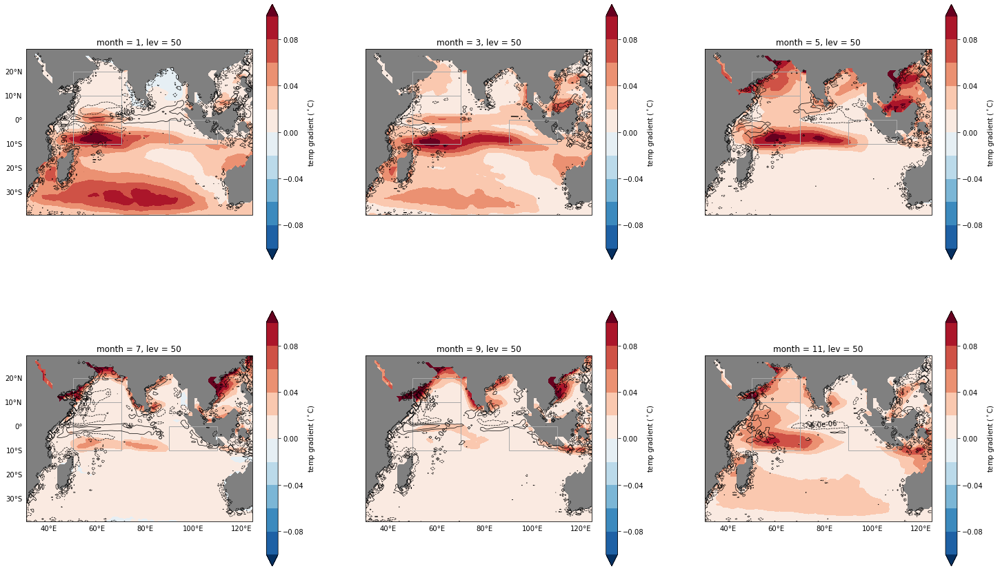

In [134]:
from matplotlib import ticker
#fmt = ticker.FormatStrFormatter('%.2e')
def plot_testnew(MM_D):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdz']
       
        u=HB['wcur']

        #now turn all these variables into an array
        if i == 0:
            txm = tx

            um = u

        else:
            txm = xr.concat([txm, tx], dim = 'model')
            
            um = xr.concat([um, u], dim = 'model')
            
    #Now calculate the multimodel medians
    txmm = txm.median(dim = 'model')

    umm = um.median(dim = 'model')


    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT

        
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25, 15), sharex='all',
                             subplot_kw={"projection": ccrs.PlateCarree()})
    fig.set_facecolor('white')
    for i, ax in enumerate(axes.reshape(-1)):
        fmt.create_dummy_axis()
        txmm[2*i].plot.contourf(#transform=ccrs.PlateCarree(),
                                 #subplot_kws={"projection": ccrs.PlateCarree()}, 
                                  vmin = -0.1, vmax = 0.1,
                                levels =11,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                    cbar_kwargs=dict(label='temp gradient ($^\circ$C)'), extend = 'both', ax = ax)
        CS = (umm)[2*i].plot.contour(levels = [-1.5e-5,-0.5e-5,0.5e-5, 1.5e-5],
                                              colors = 'k', linewidths = 0.7, negative_linestyles = '..', ax = ax)
    
        #CS = ax.contour(vmm.lon, vmm.lat, vmm[i],  colors = 'k', levels = 7, linewidths = 0.4)
        ax.clabel(CS, CS.levels, inline=False, fmt='%1.1e', fontsize=10)
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0, linestyle='--')
        if i in [0,1,2]:
            gl.bottom_labels = False
        if i in [1,2,4,5]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        print (CS.levels)        
a = plot_testnew(OBS2)

In [147]:
np.median([1,5,1,1,])

1.0

In [100]:
-5e-6 - 5e-6

-1e-05

<Figure size 2160x1440 with 0 Axes>

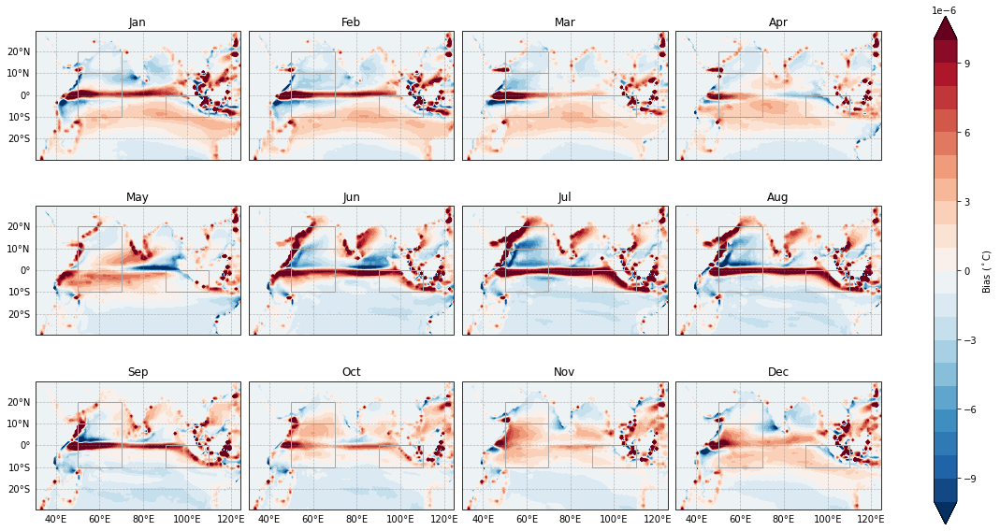

In [148]:
def plot_testnew(MM_D):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
      
        u=HB['wcur']

        #now turn all these variables into an array
        if i == 0:

            um = u

        else:
            
            um = xr.concat([um, u], dim = 'model')
            
    #Now calculate the multimodel medians

    umm = um.median(dim = 'model')


    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    plt.figure(figsize = (30,20))
   
    fg = ((umm).sel(lat=slice(-40,30),lon=slice(30,125))).plot.contourf(col='month', col_wrap = 4,  transform=ccrs.PlateCarree(),
                             subplot_kws={"projection": ccrs.PlateCarree()}, 
                              figsize=(16,8), vmin = -1e-5, vmax =1e-5 , levels =21,  cmap = 'RdBu_r',#can do 11 or 21 levels
                                cbar_kwargs=dict(label='Bias ($^\circ$C)')) 
    #Add in features
    for i, ax in enumerate(fg.axes.flat):
        #ax.coastlines()
        ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
        if i in [0,1,2,3,4,5,6,7]:
            gl.bottom_labels = False
        if i in [1,2,3,5,6,7,9,10,11]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        #add in the boxes of interest
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
    #now add the month labels
    titles =['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun','Jul', 
             'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    for ax,title in zip(fg.axes.flatten(),titles):
        ax.set_title(title )
        
        
    
a = plot_testnew(models3)

In [16]:
#load in era5 wind
e5u = xr.open_dataarray("/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_tauu.nc")

In [17]:
e5u

<xarray.DataArray 'iews' (month: 12, lat: 180, lon: 360)>
[777600 values with dtype=float32]
Coordinates:
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [42]:
models2

{'CanESM5': {'dtdx': <xarray.DataArray (month: 12, lat: 60, lon: 95)>
  array([[[         nan,          nan, ...,          nan,          nan],
          [         nan,          nan, ...,          nan,          nan],
          ...,
          [         nan,          nan, ..., 1.992499e-05, 6.814089e-06],
          [         nan,          nan, ..., 5.848882e-05, 2.688471e-05]],
  
         [[         nan,          nan, ...,          nan,          nan],
          [         nan,          nan, ...,          nan,          nan],
          ...,
          [         nan,          nan, ..., 2.352982e-05, 9.725601e-06],
          [         nan,          nan, ..., 6.192038e-05, 2.962348e-05]],
  
         ...,
  
         [[         nan,          nan, ...,          nan,          nan],
          [         nan,          nan, ...,          nan,          nan],
          ...,
          [         nan,          nan, ..., 6.660369e-06, 9.992044e-07],
          [         nan,          nan, ..., 2.274022e-05,

In [116]:
a.collections[0].plot()

AttributeError: 'NoneType' object has no attribute 'collections'

Correlate currents/tempgrads with winds at gridpoints

In [19]:
#load in currents/tempgrads and winds
#load in the zonal advection term, zonal current and zonal temperatrure gradient
#lok at temp gradients and currents
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/CMIP6_HB_new/'
#dict with file names
varis = {'dtdx':'_dtx.nc', 'dtdy':'_dty.nc', 'dtdz':'_dtz.nc',
             'wcur':'_wcur.nc', 'vcur':'_vcur.nc', 'ucur':'_ucur.nc', 
             'uw':'_tauu.nc', 'vw':'_tauv.nc',
         'ua':'_u_advection.nc', 'va':'_v_advection.nc', 'wa':'_w_advection.nc', 
         'qnet':'_qnet.nc', 'lhf': '_hfls.nc', 'wspd':'_wspd.nc'}
models3={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                if key == 'wcur':
                    var = var.groupby('time.month').mean('time')
                #put into dict
                mod[key]=var
                models3[model] = mod
            except Exception as e:
                print(e)
                pass
        #now append data to model dict


[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_dtx.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_dty.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_dtz.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_wcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_vcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_ucur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_tauu.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_tauv.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_u_advection.nc'
[Errno 2] No su

In [41]:
import xskillscore as xs
def corr_MM(MM_D, v1, v2):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        T=HB[v1] 
        U=HB[v2]
        #T = T - e5u
        
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
    #now we can do an intermodel correlation for different time periods
    c = xs.pearson_r(TM, UM, dim = 'model')
    p = xs.pearson_r_p_value(TM, UM, dim = 'model')
    map_proj = ccrs.PlateCarree()
    p = (c.where(p<= 0.05)).where(abs(c)>=0.5).plot.contourf(transform = ccrs.PlateCarree(), col = 'month', col_wrap = 4,
                                  subplot_kws={"projection": map_proj},
                                    levels = [-1, -0.75, -0.5, 0, 0.5,0.75,1]                                                        
    )
    for i, ax in enumerate(p.axes.flat):
        ax.coastlines()
        #ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
        if i in [0,1,2,3,4,5,6,7]:
            gl.bottom_labels = False
        if i in [1,2,3,5,6,7,9,10,11]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
        ax.add_patch(patches.Rectangle((50,-10), 20, 20, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((50,10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
        ax.add_patch(patches.Rectangle((90,-10), 20, 10, color="darkgray", fill = False, linewidth=1, alpha = 1))
    p.fig.suptitle('significant (p< 0.05) intermodel \n pearson r Corr '+v1+':'+v2)


    return p
    

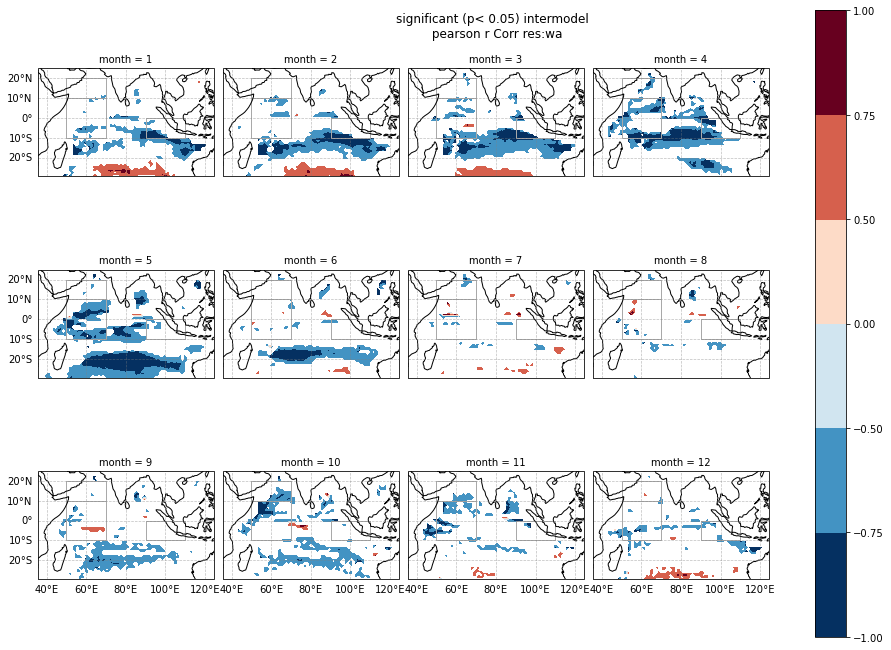

In [44]:
plt.rcParams.update({'font.size': 10})

corr_MM(models1, 'res', 'wa')

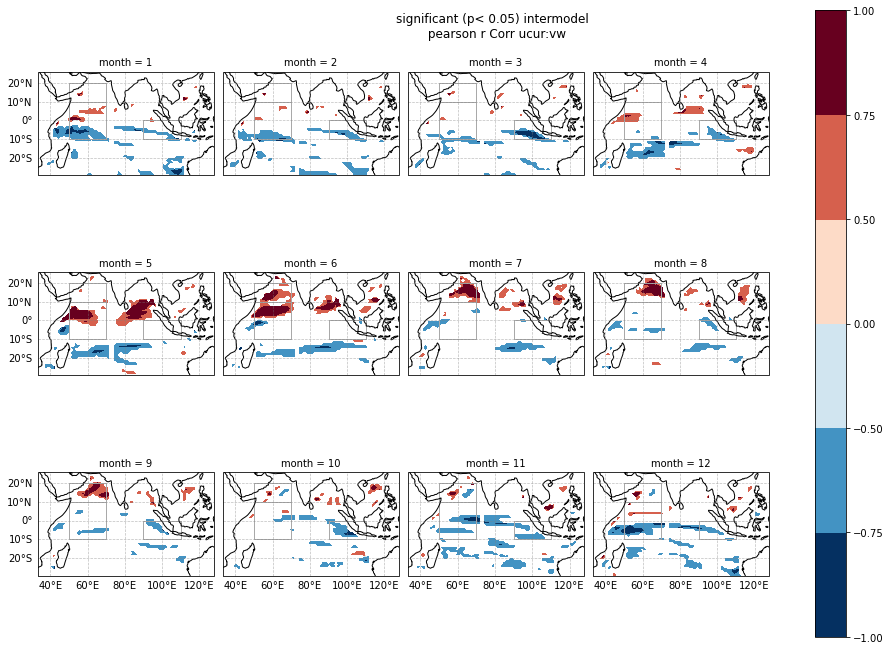

In [62]:
corr_MM(models3, 'ucur', 'vw')

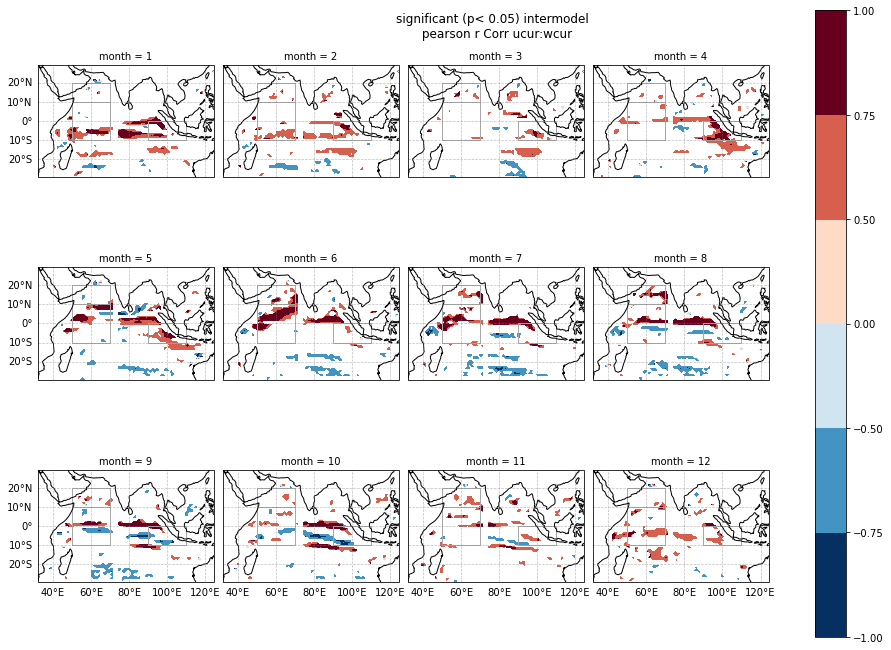

In [176]:
corr_MM(models3, 'ucur', 'wcur')

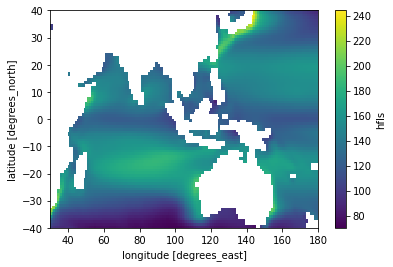

In [26]:
models3['CESM2']['lhf'].mean('month').plot()

In [56]:
models3['ACCESS-CM2']['ucur'] 

<xarray.DataArray 'uo' (month: 12, lat: 60, lon: 95)>
array([[[      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan],
        ...,
        [      nan,       nan, ...,  0.016042,  0.020222],
        [      nan,       nan, ..., -0.001402,  0.00423 ]],

       [[      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan],
        ...,
        [      nan,       nan, ...,  0.010329,  0.016746],
        [      nan,       nan, ..., -0.004564,  0.000137]],

       ...,

       [[      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan],
        ...,
        [      nan,       nan, ...,  0.04367 ,  0.048799],
        [      nan,       nan, ...,  0.010471,  0.022274]],

       [[      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan],
        ...,
        [      nan,       nan, ...,  0.037902,  0.042812],
        [      nan,       nan, ...,  0.009879,  0.021363]]])
Coordinates:
  * lon      (lon) float64 30.5 31.5 32.5 33.5 34.5 ... 121.5 122.5 123.5 124.5
  * lat      (lat) float64 -29.5 -28.5 -27.5 -26.5 -25.5 ... 26.5 27.5 28.5 29.5
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [206]:
def linear_trend(x, y):
    pf = np.polyfit(x, y, 1)
    return xr.DataArray(pf[0])
def regress(var1, var2):
    slope = xr.apply_ufunc(linear_trend,
                        var1, var2,
                        vectorize=True,
                        dask = 'parallelized',
                        input_core_dims=[['model'], ['model']],# reduce along 'model'
                        )
    return slope

In [211]:
import xskillscore as xs
def corr_MM(MM_D, v1, v2):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        T=HB[v1]
        U=HB[v2]

        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
    #now we can do an intermodel correlation for different time periods
    R = xs.linslope(TM, UM)
    map_proj = ccrs.PlateCarree()
    p = R.plot(transform = ccrs.PlateCarree(), col = 'month', col_wrap = 4,
                                  subplot_kws={"projection": map_proj})
   #c = xs.pearson_r(TM, UM, dim = 'model')
   # p = xs.pearson_r_p_value(TM, UM, dim = 'model')
   # map_proj = ccrs.PlateCarree()
   # p = (c.where(p<= 0.05)).where(abs(c)>=0.5).plot.contourf(transform = ccrs.PlateCarree(), col = 'month', col_wrap = 4,
   #                               subplot_kws={"projection": map_proj},
   #                                 levels = [-1, -0.75, -0.5, 0, 0.5,0.75,1]                                                        
   # )
    for i, ax in enumerate(p.axes.flat):
        ax.coastlines()
        #ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
        if i in [0,1,2,3,4,5,6,7]:
            gl.bottom_labels = False
        if i in [1,2,3,5,6,7,9,10,11]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
    p.fig.suptitle('significant (p< 0.05) intermodel \n pearson r Corr '+v1+':'+v2)
    return p
    

In [212]:
corr_MM(models3, 'uw', 'ucur')

AttributeError: module 'xskillscore' has no attribute 'linslope'

In [213]:
xs.

<module 'xskillscore' from '/home/z5113258/anaconda3/lib/python3.8/site-packages/xskillscore/__init__.py'>

In [214]:
conda update xskillscore

Solving environment: done

## Package Plan ##

  environment location: /home/z5113258/anaconda3

  added / updated specs:
    - xskillscore


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    conda-22.9.0               |   py38h06a4308_0         884 KB
    ------------------------------------------------------------
                                           Total:         884 KB

The following packages will be REMOVED:

  python_abi-3.8-2_cp38

The following packages will be UPDATED:

  conda                               4.13.0-py38h06a4308_0 --> 22.9.0-py38h06a4308_0



conda-22.9.0         | 884 KB    | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done

Note: you may need to restart the kernel to use updated packages.


In [192]:
import xskillscore as xs

In [193]:
def linear_trend(x, y):
    pf = np.polyfit(x, y, 1)
    return xr.DataArray(pf[0])

In [194]:
def regress(var1, var2):
    slope = xr.apply_ufunc(linear_trend,
                        var1, var2,
                        vectorize=True,
                        dask = 'parallelized',
                        input_core_dims=[['model'], ['model']],# reduce along 'model'
                        )
    return slope

Text(0.5, 1.0, 'WTIO u dtdx corr')

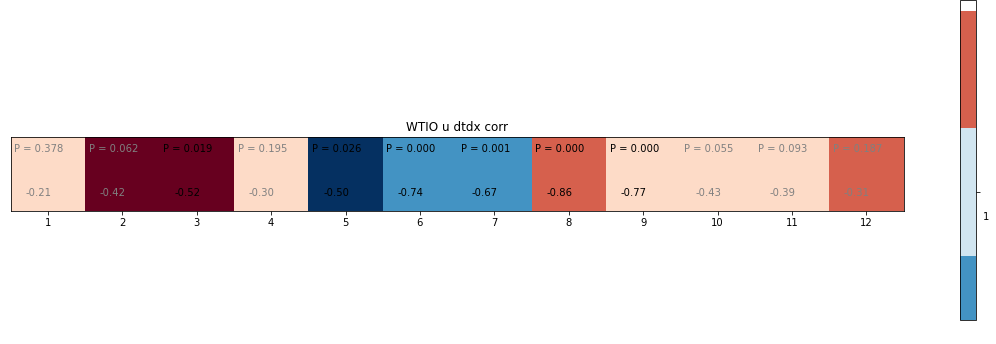

In [236]:
#look at meridonal wind and w advection in SETIO region



def get_model_DS(MODS1, lat, lat_r, lon, lon_r):
    for i, model in enumerate(MODS1.keys()):
        HB = MODS1[model]
        TAU = MODS1[model]
        U=get_region((-1*HB['dtdx']), lat, lat_r, lon, lon_r)
        TAUU=get_region(TAU['ucur'], lat, lat_r, lon, lon_r)
        U = U.assign_coords({"model":model})
        TAUU = TAUU.assign_coords({"model":model})

        if i == 0:
            UM = U
            TUM=TAUU
        else:
            UM = xr.concat([UM, U], dim = 'model')
            TUM = xr.concat([TUM, TAUU], dim = 'model')
            
    DS = xr.Dataset(data_vars=dict(
            UM=(["model", "month"], UM),
            TUM=(["model", "month"], TUM)),
        coords=dict(
            month=(UM.month),
            model=(UM.model)),
        attrs=dict(description="Dataset of all heat budget varibales to correlate/scatter plot with"))
    return DS

DSU = get_model_DS(models3,  -10,10,50,70)

import xskillscore as xs

C = xs.pearson_r(DSU['UM'], DSU['TUM'], dim = 'model')
P = xs.pearson_r_p_value(DSU['UM'], DSU['TUM'], dim = 'model')
tu = regress(DSU['UM'], DSU['UM']).assign_coords({"var":1})
tv = regress(DSU['TUM'], DSU['TUM']).assign_coords({"var":2})

plt.figure(figsize=(20,6))
plt.imshow([tu.values], 'RdBu_r', vmin = tu.values.min(), vmax = tu.values.max())
plt.colorbar()
for i in range(0,12):
    plt.text(i-0.3,0.3,f'{C.sel(month = i+1).values:.2f}', 
                     color = 'k' if P.sel(month = i+1).values < 0.05 else 'gray')
    plt.text(i-0.45,-0.3,f'P = {P.sel(month = i+1).values:.3f}', 
                     color = 'k' if P.sel(month = i+1).values < 0.05 else 'gray')
plt.xticks(range(0,12), range(1,13))   
plt.yticks([])
plt.title('WTIO u dtdx corr')

In [71]:
AS_arr = xr.DataArray([-2,-2,-2,-2,-1.5,-1,0,0,0,-1,-2,-2],  
                      dims=dict(month = ['J','F','M','A','M','J','J','A','S','O','N','D']))

In [159]:
def get_SSTBIAS(MM_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    TM, UM, VM, WM, QM, RM, SM = get_model_TS(MM_D)
    #Now calculate the multimodel means/
    TMM = SM.median(dim = 'model')
    T_argo = OBS['ARGO']['SST']
    diff = get_region((TMM), lat, lat_r, lon, lon_r) - get_region((T_argo), lat, lat_r, lon, lon_r)
    return diff

In [160]:
WTIO = get_SSTBIAS(models1, -10,10, 50,70)
SETIO = get_SSTBIAS(models1, -10,0, 90,110)
AS = get_SSTBIAS(models1, 10,20, 50,70)

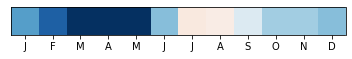

In [167]:
plt.imshow([AS], cmap = 'RdBu_r', vmin = -1.5, vmax = 1.5)
plt.xticks(range(0,12), ['J','F','M','A','M','J','J','A','S','O','N','D'])   
plt.yticks([])
plt.savefig('AS.svg')

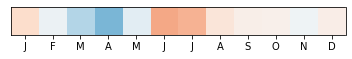

In [168]:
plt.imshow([WTIO], cmap = 'RdBu_r', vmin = -1.5, vmax = 1.5)
plt.xticks(range(0,12), ['J','F','M','A','M','J','J','A','S','O','N','D'])   
plt.yticks([])
plt.savefig('WTIO.svg')

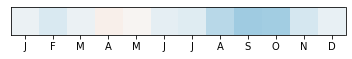

In [169]:
plt.imshow([SETIO], cmap = 'RdBu_r', vmin = -1.5, vmax = 1.5)
plt.xticks(range(0,12), ['J','F','M','A','M','J','J','A','S','O','N','D'])   
plt.yticks([])
plt.savefig('SETIO.svg')

([], [])

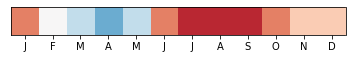

In [84]:
AS_arr = xr.DataArray([1,0,-0.5,-1,-0.5,1,1.5,1.5,1.5,1,0.5,0.5],  
                      dims=dict(month = ['J','F','M','A','M','J','J','A','S','O','N','D']))
plt.imshow([AS_arr], cmap = 'RdBu_r', vmin = -2, vmax = 2)
plt.xticks(range(0,12), ['J','F','M','A','M','J','J','A','S','O','N','D'])   
plt.yticks([])

([], [])

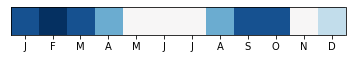

In [83]:
AS_arr = xr.DataArray([-1.75,-2,-1.75,-1,0,0,0,-1,-1.75,-1.75,0,-0.5],  
                      dims=dict(month = ['J','F','M','A','M','J','J','A','S','O','N','D']))
plt.imshow([AS_arr], cmap = 'RdBu_r', vmin = -2, vmax = 2)
plt.xticks(range(0,12), ['J','F','M','A','M','J','J','A','S','O','N','D'])   
plt.yticks([])

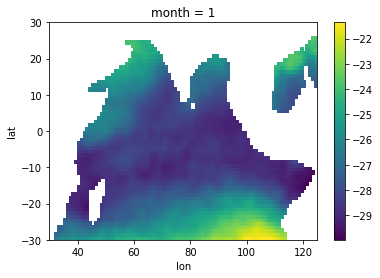

In [114]:
(a - OBS['ARGO']['SST'])[0].plot()

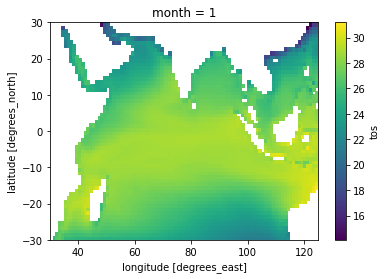

In [119]:
a[0].plot()

In [317]:
test = 'vw'

In [345]:
models3['ACCESS-CM2']

{'dtdx': <xarray.DataArray (month: 12, lat: 60, lon: 95)>
 array([[[          nan,           nan, ...,           nan,           nan],
         [          nan,           nan, ...,           nan,           nan],
         ...,
         [          nan,           nan, ...,  7.684584e-06,  1.146060e-05],
         [          nan,           nan, ...,           nan, -4.280404e-06]],
 
        [[          nan,           nan, ...,           nan,           nan],
         [          nan,           nan, ...,           nan,           nan],
         ...,
         [          nan,           nan, ...,  1.032491e-05,  1.403085e-05],
         [          nan,           nan, ...,           nan, -4.461671e-06]],
 
        ...,
 
        [[          nan,           nan, ...,           nan,           nan],
         [          nan,           nan, ...,           nan,           nan],
         ...,
         [          nan,           nan, ..., -2.337334e-06, -2.110847e-06],
         [          nan,           nan, ...

In [379]:
def test_dicts(MODS, v1, v2, lat, lat_r, lon, lon_r):
    for i, model in enumerate(MODS.keys()):
        HB = MODS[model]
        v1a = HB[v1]
        v2a = HB[v2]
        print(v1a)
        v1b = get_region(v1a, lat, lat_r, lon, lon_r)

    return v1a


In [388]:
def get_model_DS(MODS, v1, v2, lat, lat_r, lon, lon_r):
    for i, model in enumerate(MODS.keys()):
        HB = MODS[model]
        v1a = HB[v1]
        v2a = HB[v2]
        v1a = get_region(v1a, lat, lat_r, lon, lon_r)
        v2a = get_region(v2a, lat, lat_r, lon, lon_r)

        v1a = v1a.assign_coords({"model":model})
        v2a = v2a.assign_coords({"model":model})
        if i == 0:
            v1m = v1a
            v2m = v2a
        else:
            v1m = xr.concat([v1m, v1a], dim = 'model')
            v2m = xr.concat([v2m, v2a], dim = 'model')
    DS = xr.Dataset(data_vars=dict(
            v1=(["model", "month"], v1m),
            v2=(["model", "month"], v2m)),
        coords=dict(
            month=(v1m.month),
            model=(v1m.model)),
            #lat = (TM.lat), lon = (TM.lon)),
        attrs=dict(description="Dataset of all heat budget varibales to correlate/scatter plot with"))
    return DS

In [389]:
DS_vw_uc = get_model_DS(models3, "ucur", "vw", -10,0,90,110)

In [390]:
DS_vw_uc

<xarray.Dataset>
Dimensions:  (model: 20, month: 12)
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * model    (model) <U17 'CanESM5' 'FGOALS-f3-L' ... 'EC-Earth3-AerChem'
Data variables:
    v1       (model, month) float64 0.03072 0.003383 0.01764 ... -0.0487 0.08041
    v2       (model, month) float32 -0.0084 -0.01234 ... 0.02468 0.004471
Attributes:
    description:  Dataset of all heat budget varibales to correlate/scatter p...

In [340]:
from xskillscore import pearson_r, pearson_r_p_value

In [305]:
r = pearson_r(DS_vw_uc['v1m'], DS_vw_uc['v2m'], dim = 'model')
p = pearson_r_p_value(DS_vw_uc['v1m'], DS_vw_uc['v2m'], dim = 'model')

In [306]:
marks = ['o', '+', 'x', '*', '.']
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
test ={}
count = 0
for col in colors:
    for mark in marks:
        test[count] = [mark, col]
        count = count+1

In [313]:
from sklearn.linear_model import LinearRegression

def plot_scatter(DS, month):
    plt.figure()
    for i, name in enumerate(DS.model.values):
        plt.scatter(DS['v1m'][i, month],DS['v2m'][i, month], c=test[i][1], marker=test[i][0], label = name)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    regr = LinearRegression().fit(DS['v1m'][:,month].values.reshape(-1, 1),
                                  DS['v2m'][:, month].values.reshape(-1, 1))
    x = DS['v1m'][:, month].values.reshape(-1, 1)
    m = regr.coef_
    b= regr.intercept_
    plt.plot(x, (m*x + b), c = 'k', alpha = 0.5, lw = 0.7)
    r = pearson_r(DS['v1m'], DS['v2m'], dim = 'model')
    p = pearson_r_p_value(DS['v1m'], DS['v2m'], dim = 'model')
    #              get_region(SSTB, lat, latr, lon, lonr)[:, month], dim = 'model')

    #plt.text(bbox_to_anchor=(0.05, 1), str(regr.coef_[:3]))
    plt.title('Month = '+str(month+1)+'\n regression coefficient = '+str(regr.coef_[0][0])+'\n Pearson r = '+str(r.values[month])+' p = '+str(p.values[month]))
    plt.xlabel('u wind stress')
    plt.ylabel('wadv')


In [314]:
r = pearson_r(DS_vw_uc['v1m'], DS_vw_uc['v2m'], dim = 'model')
p = pearson_r_p_value(DS_vw_uc['v1m'], DS_vw_uc['v2m'], dim = 'model')

In [315]:
r,p

(<xarray.DataArray (month: 12)>
 array([-0.64079555,  0.13016834,  0.54242767,  0.35373695, -0.2142857 ,
         0.04635717,  0.31352037,  0.49030053,  0.68934798,  0.82274068,
         0.59434101, -0.01874608])
 Coordinates:
   * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12,
 <xarray.DataArray (month: 12)>
 array([2.33282260e-03, 5.84389893e-01, 1.34752394e-02, 1.26001174e-01,
        3.64294976e-01, 8.46120844e-01, 1.78283942e-01, 2.81830542e-02,
        7.73097259e-04, 8.45584158e-06, 5.71776113e-03, 9.37475356e-01])
 Coordinates:
   * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12)

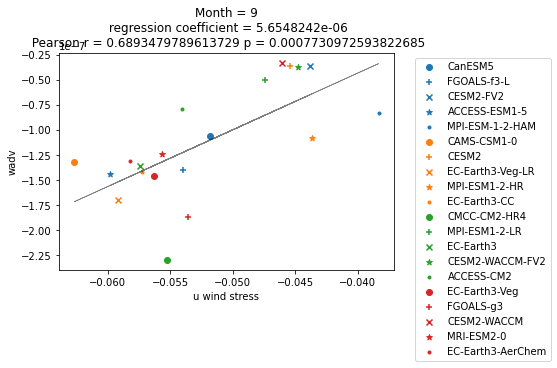

In [316]:
plot_scatter(DS_vw_uc, 8)

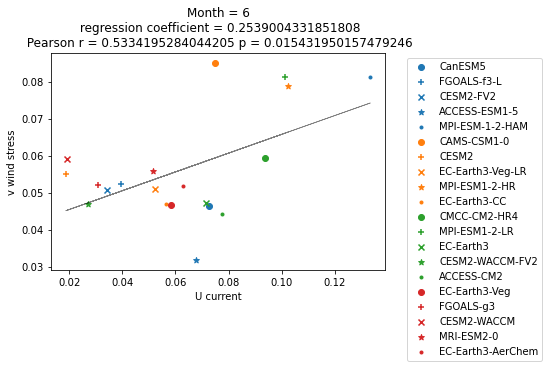

In [129]:
plot_scatter(DS_vw_uc, 5)

In [ ]:
regr = LinearRegression().fit(DS_vw_uc['v1m'][, month].values.reshape(-1, 1),
                                  DS_vw_uc['v2m'][i, month].values.reshape(-1, 1))
    x = DS_vw_uc['v1m'][i, month].values.reshape(-1, 1)
    m = regr.coef_
    b= regr.intercept_
    plt.plot(x, (m*x + b), c = 'k', alpha = 0.5, lw = 0.7)

In [ ]:
from sklearn.linear_model import LinearRegression
def plot_regress(OBS, mods, lat, latr, lon, lonr):
    TO, UO, VO, WO, QO, RO = get_obs_TS(OBS)
    TM, UM, VM, WM, QM, RM, SST = get_model_TS(mods)
    
    tu = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(UM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})
    tv = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(VM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})
    tw = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(WM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})
    tq = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(QM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})
    tr = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(RM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})

    #NOW MAKE A SCATTER PLOT FOR EACH MONTH AND VARIABLE COMBO
    for var in [DS_vw_uc]:
        for month in range(0,12):
            plt.figure()
            for i, name in enumerate(TM.model.values):
                plt.scatter(get_region(var, lat, latr, lon, lonr)[i, month],
                            get_region(SSTB, lat, latr, lon, lonr)[i, month], 
                            c=test[i][1], marker=test[i][0], label = name)
            regr = LinearRegression().fit(get_region(var, lat, latr, lon, lonr)[:, month].values.reshape(-1, 1),
                                              get_region(SSTB, lat, latr, lon, lonr)[:, month].values.reshape(-1, 1))
            x = get_region(var, lat, latr, lon, lonr)[:, month].values.reshape(-1, 1)
            m = regr.coef_
            b= regr.intercept_
            plt.plot(x, (m*x + b), c = 'k', alpha = 0.5, lw = 0.7)
            ru = xs.pearson_r(get_region(var, lat, latr, lon, lonr)[:, month], 
                              get_region(SSTB, lat, latr, lon, lonr)[:, month], dim = 'model')

            #plt.text(bbox_to_anchor=(0.05, 1), str(regr.coef_[:3]))
            plt.title('Month = '+str(month+1)+'\n regression coefficient = '+str(regr.coef_)+'\n Pearson r = '+str(ru.values) )
            plt.xlabel('Qnet')
            plt.ylabel('SST bias')
            plt.axvline(get_region(QO[0][month], lat, latr, lon, lonr), alpha = 0.5, ls = '--', c = 'tab:purple', label = 'GODAS')
            plt.axvline(get_region(QO[1][month], lat, latr, lon, lonr), alpha = 0.5, ls = '--', c = 'tab:olive', label = 'ORAS5')
            plt.axvline(get_region(QO[2][month], lat, latr, lon, lonr), alpha = 0.5, ls = '--', c = 'tab:cyan', label = 'SODA3.4.2')
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

 
    DA1 = xr.concat([tu, tv, tw, tq, tr], dim = "var")
    #DA1.plot.imshow()#plto colors where significant
    #plt.yticks([1,2,3,4,5],['$dT/dt$:$Advection_{u}$','$dT/dt$:$Advection_{v}$',
    #                        '$dT/dt$:$Advection_{w}$','$dT/dt$:$Qnet$','$dT/dt$:$resid$',])#plot variables corerlated
    #plt.ylabel(' ')
    #plt.title("Intermodel regression coeficient by month ")
    return

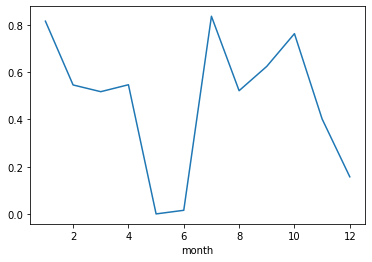

In [47]:
p.plot()

In [49]:
DS_vw_uc['v1m'][:,4]

<xarray.DataArray 'v1m' (model: 20)>
array([0.11764656, 0.0496756 , 0.04790861, 0.09155826, 0.13806988,
       0.14949596, 0.04551909, 0.05826792, 0.08575643, 0.05888989,
       0.10415936, 0.11136777, 0.06560429, 0.04232836, 0.09530055,
       0.05665631, 0.03995529, 0.04704306, 0.08597643, 0.05691746])
Coordinates:
    month    int64 5
  * model    (model) <U17 'CanESM5' 'FGOALS-f3-L' ... 'EC-Earth3-AerChem'

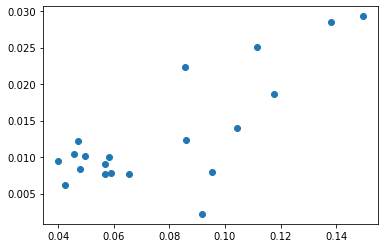

In [50]:
plt.scatter(DS_vw_uc['v1m'][:,4], DS_vw_uc['v2m'][:,4])

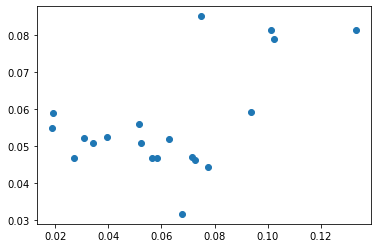

In [51]:
plt.scatter(DS_vw_uc['v1m'][:,5], DS_vw_uc['v2m'][:,5])

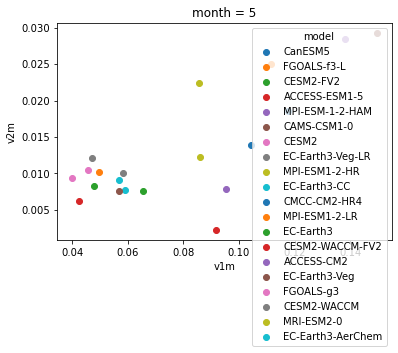

In [54]:
key_dict = dict{models3.keys()}